In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
#%matplotlib 
from scipy.interpolate import interp1d
#Hide all warnings
import warnings
warnings.filterwarnings('ignore')
import glob
import os
import multiprocessing
from joblib import Parallel, delayed
from timeit import default_timer as timer

In [2]:
#Dictionary of Stimulation movies characterising their properties: Type of Movie, Movie Sequence
Movies = {'Increasing Dot': [{'ID':1},{'Sequence':[50,100,200,400,800,1200]},{'bin_num':1600}],
          'Moving Dot': [{'ID':2},{'Sequence':[0,45,90,135,180,225,270,315]},{'bin_num':4800}],
          'Looming Black': [{'ID':3},{'Sequence':['Looming Speed1','Speed1','Speed1','Speed1','Speed1',
                                         'Looming Speed2','Speed2','Speed2','Speed2','Speed2',
                                         'Looming Speed3','Speed3','Speed3','Speed3','Speed3',
                                         'Looming Speed4','Speed4','Speed4','Speed4','Speed4',
                                         ]},
                            
                            {'Type':['Looming', 'Dot', 'Dot', 'Dot', 'Dot',
                                     'Looming', 'Dot', 'Dot', 'Dot', 'Dot',
                                     'Looming', 'Dot', 'Dot', 'Dot', 'Dot',
                                     'Looming', 'Dot', 'Dot', 'Dot', 'Dot',
                                     ]},
                            
                            {'Speed':[
                                     200,200,200,200,200,
                                     400,400,400,400,400,
                                     800,800,800,800,800,
                                     1400,1400,1400,1400,1400,  
                                     ]},
                            
                            {'bin_num':12800}],
          
          'Looming White': [{'ID':4},
                            {'Sequence':['Looming Speed1','Speed1','Speed1','Speed1','Speed1',
                                         'Looming Speed2','Speed2','Speed2','Speed2','Speed2',
                                         'Looming Speed3','Speed3','Speed3','Speed3','Speed3',
                                         'Looming Speed4','Speed4','Speed4','Speed4','Speed4',
                                         ]},
                            
                            {'Type':['Looming', 'Dot', 'Dot', 'Dot', 'Dot',
                                     'Looming', 'Dot', 'Dot', 'Dot', 'Dot',
                                     'Looming', 'Dot', 'Dot', 'Dot', 'Dot',
                                     'Looming', 'Dot', 'Dot', 'Dot', 'Dot',
                                     ]},
                            
                            {'Speed':[
                                     200,200,200,200,200,
                                     400,400,400,400,400,
                                     800,800,800,800,800,
                                     1400,1400,1400,1400,1400,
                                     ]},
                            
                            {'bin_num':12800},]
         }
# List of columns
Columns = ['Movie','Trial', 'Subfeature','Pre/Post Stimulus']
#increasing dot 1600 for 50ms


In [62]:
# Function takes Metadata Excel file information, opens all files, preprocesses and applies movie specific function
def Preprocessing (bins_ms,rel_Time): #feed excel files
    #rel_Time: If code should bin to relative or absolute time
    cd = os.getcwd()
    metadata = pd.read_excel(os.getcwd() + '/Input/Metadata.xlsx') #Open Metadatafile
    
    count = 0
    #counts = list(range(len(metadata.Filename)))####Change
    #filelist = metadata.Filename####Change
    #Make filelist of existing xls files in temp folder
    for file in metadata.Filename: #Read all files listed in Metadata file
    #def calculation(file,count): ####Change
        start=timer()
        data = pd.read_excel(cd + '/Input/' + str(file) + '.xls', usecols = ['Time of Peak (ms)']) #read recording
        stimulus = pd.read_excel(cd + '/Input/' + str(file) + '_Stimulus' + '.xls', usecols = ['Time of Peak (ms)']) #read stimulus

        #Crop out data for movie between Starttime and Stoptime column of Metadata.xlsx
        data = data[data['Time of Peak (ms)'].between(metadata.Starttime[count], metadata.Stoptime[count])]
        data.reset_index(inplace=True, drop=True)
        stimulus = stimulus[stimulus['Time of Peak (ms)'].between(metadata.Starttime[count], metadata.Stoptime[count])]
        stimulus.reset_index(inplace=True, drop=True)

        #Set Time of Peak (ms) to startpoint 0 (makes metadata timepoints useless from here on)
        data['Time of Peak (ms)'] = data['Time of Peak (ms)']-min(stimulus['Time of Peak (ms)'])
        stimulus['Time of Peak (ms)'] = stimulus['Time of Peak (ms)']-min(stimulus['Time of Peak (ms)']) #Shift stimulus by same time

        #Replace NaN with 0
        data = data.fillna(value=0)          # replace all NaN with 0
        stimulus = stimulus.fillna(value=0)  # replace all NaN with 0

        #bin data and convert to frequency: Choose between relative or absolute time
        output = pd.DataFrame()
        if rel_Time == True:
            Time = 'relativeTime'
            bins = pd.interval_range(start=0, end=max(stimulus['Time of Peak (ms)'])+2000, freq=round((max(stimulus['Time of Peak (ms)'])+2000)/Movies[metadata.Movietype[count]][2]['bin_num']))
            output['Freq_data'] = pd.cut(data['Time of Peak (ms)'], bins, include_lowest=True, labels=True).value_counts(normalize=False, sort=False, ascending=False, bins=None, dropna=True)
            output['Stimulus'] = pd.cut(stimulus['Time of Peak (ms)'], bins, include_lowest=True, labels=True).value_counts(normalize=False, sort=False, ascending=False, bins=None, dropna=True)
            #Create Time index for later cropping
            output['Time_ms']=(((np.linspace(1,len(output),len(output)))-1)*(round((max(stimulus['Time of Peak (ms)'])+2000)/Movies[metadata.Movietype[count]][2]['bin_num'])))
            #Convert counts to frequency f=1/binsize --> counts/0.03 for 30ms bins
            output['Freq_data']=output['Freq_data']/((round((max(stimulus['Time of Peak (ms)']))/Movies[metadata.Movietype[count]][2]['bin_num']))/1000)
        else:
            Time = 'absoluteTime'
            bins = pd.interval_range(start=0, end=max(stimulus['Time of Peak (ms)'])+2000, freq=bins_ms)
            output['Freq_data'] = pd.cut(data['Time of Peak (ms)'], bins, include_lowest=True, labels=True).value_counts(normalize=False, sort=False, ascending=False, bins=None, dropna=True)
            output['Stimulus'] = pd.cut(stimulus['Time of Peak (ms)'], bins, include_lowest=True, labels=True).value_counts(normalize=False, sort=False, ascending=False, bins=None, dropna=True)
            #Create Time index for later cropping
            output['Time_ms']=(((np.linspace(1,len(output),len(output)))-1)*bins_ms)
            #Convert counts to frequency f=1/binsize --> counts/0.03 for 30ms bins
            output['Freq_data']=output['Freq_data']/(bins_ms/1000)
            
        #Create Index
        #output['Time_ms']=(((np.linspace(1,len(output),len(output)))-1)*bins_ms)
        #Set all Stimulus values bigger than 0 to 1
        output.Stimulus[output['Stimulus']>0]=1
        output['Stimulus'] = output.Stimulus.rolling(3, center=True).sum()#Clean up to remove unwanted stimulus gaps
        output.Stimulus[output['Stimulus']>0]=1           # Remove 
        output.Stimulus = output.Stimulus.fillna(value=0) # Remove NaN

        #Determine Stimulus Start and Stop times
        output['Start_Stop'] = output['Stimulus'].diff()
        output.reset_index(inplace=True)

        #Make average over each trial

        #Determine start and stop times
        start = output['Time_ms'][output['Start_Stop']==1].reset_index()
        stop = output['Time_ms'][output['Start_Stop']==-1].reset_index()

        #Clean output dataframe
        output.drop('index', axis=1, inplace=True)
        output = output.fillna(value=0)

        #Generate dataframe where each column represents one Trial
        output_AVG = pd.DataFrame()
        step = len(start)/metadata.Repeats[count] #Calculate the stepsize resp. the number of movies within one trial

        #print(file, step, len(start), metadata.Repeats[count]) ###################

        #Crop out each trial and attach each column 
        for i in range(metadata.Repeats[count]):
            temp = pd.DataFrame()
            temp['Trial'+str(i)] = output.Freq_data[output['Time_ms'].between(start.Time_ms[i*step],stop.Time_ms[i*step+(step-1)]+2000)]
            temp.reset_index(inplace=True, drop=True)
            output_AVG = pd.concat([output_AVG,temp],axis=1)

        #Remove NaN that appear because of slighly different length of concatenated columns
        output_AVG = output_AVG.fillna(value=0)

        #Calculate Mean and Standard Deviation and add to final dataframe    
        mean = pd.DataFrame()
        mean['Average'] = output_AVG.mean(axis=1) #Calculate mean
        Std = pd.DataFrame()
        Std['STD'] = output_AVG.std(axis=1)#Calculate Standard deviation
        output_AVG = pd.concat([output_AVG,mean,Std],axis=1)

        #Gaussian Smoothing for average firing rate
        output_AVG['Smooth'] = output_AVG.Average.rolling(5, center=True, win_type='gaussian').mean(std=10).fillna(value=0) 
        #Gaussian Smoothing for each Trial firing rate
        for i in range(metadata.Repeats[count]):
            temp = pd.DataFrame()
            temp['Smooth_Trial'+str(i)] = output_AVG['Trial'+str(i)].rolling(5, center=True, win_type='gaussian').mean(std=10).fillna(value=0)
            output_AVG = pd.concat([output_AVG, temp], axis=1)

        #Add remaining information columns, Stimulus, Filename, Cellname
        output_AVG['Stimulus'] = output.Stimulus[output['Time_ms'].between(start.Time_ms[0*step],stop.Time_ms[0*step+(step-1)])]
        output_AVG['Start_Stop'] = output.Start_Stop[output['Time_ms'].between(start.Time_ms[0*step],stop.Time_ms[0*step+(step-1)])]
        output_AVG['Cell#'] = metadata.Cellname[count]
        output_AVG['Filename'] = file
        output_AVG['Movietype'] = metadata.Movietype[count]
        output_AVG['Time_ms']=(((np.linspace(1,len(output_AVG),len(output_AVG)))-1)*bins_ms)
        output_AVG['Trials']=metadata.Repeats[count]

        #Adapt Stimulus signal to max of smoothing column
        output_AVG['Stimulus'] = output_AVG.Stimulus*max(output_AVG.Smooth)
        output_AVG['Time_s'] = output_AVG['Time_ms']/1000

        #Remove NaN that appear to avoid future problems
        output_AVG = output_AVG.fillna(value=0)

        #Save results as xls table for further processing
        output_AVG.to_excel(cd + '/temp/' + str(file) + ' ' + str(output_AVG.Movietype[0]) + '.xlsx', engine='xlsxwriter')

        count = count+1 # for loop counter ####Change
        stop = timer()
        duration = stop-start
        #return(list(map(calculation,filelist,counts)))
        print(str(round((count/len(metadata.Filename)*100),1)) +'%',end='\r')

In [8]:
Preprocessing(30,True) #Relative Time

In [6]:
def ClusterSingleMovie (Movietype, Genotype, Sort, col_ID, col_data,rolling, Lut):
    #FileIdentifier: Unique property of all files you want to concatenate for clustering
    #col_ID: Column containing Cell identifier
    #col_data: Column containing recording data
    #Sort: If True, it will select files based on Genotype variable
    #Lut: If True, it will generate 
    import seaborn as sns
    
    metadata = pd.read_excel(os.getcwd() + '/Input/Metadata.xlsx') #Open Metadatafile
    metadata = metadata[metadata.Movietype == Movietype].reset_index(drop=True)#Filter only for Movie type to Cluster
    if Sort == True:
        metadata = metadata[metadata.Genotype == Genotype].reset_index(drop=True)#Filter only for correct genotype
    wd = os.getcwd() + '/temp/'

    df = pd.DataFrame() #Create df for clustering
   
    #Concatenate all recordings into one df
    for i in range(len(metadata)):
        data = pd.read_excel(wd + str(metadata.Filename[i]) + ' ' + str(metadata.Movietype[i]) + '.xlsx')
        temp = pd.DataFrame()
        temp[col_ID + '_' + str(data[col_ID][0])] = data[col_data]

        #temp=temp.subtract(temp.rolling(rolling, min_periods=1).mean())
        if rolling >0:
            temp=temp.rolling(rolling, min_periods=1).mean()

        #Normalize
        temp = temp/temp.max()

        #Concatenate to output df
        df = pd.concat([df,temp],axis=1)

    df = df.fillna(value=0)
    
    #metrics=['braycurtis', 'canberra', 'chebyshev', 'cityblock', 'correlation', 'cosine', 'dice', 'euclidean', 'hamming', 'jaccard', 'kulsinski', 'matching', 'minkowski', 'rogerstanimoto', 'russellrao', 'sokalmichener', 'sokalsneath', 'sqeuclidean', 'yule']
    metrics=['jaccard']
    #methods=['single','median','weighted','average','complete']
    
    #Information on Identity etc. which the clustering algo. does not use but is plotted as additional column
    #lut = dict(zip(metadata.Identity.unique(), "gbkr"))
    if Lut == True:
        #lut = dict(zip(['Flrt3-Cre-Tom','Thy1-Flrt3-Cre'], ['red','green']))
        #row_colors = pd.DataFrame(metadata.Genotype.map(lut)).transpose() #map colors to identity
        lut = dict(zip(['ON','OFF','Unknown','ON-OFF'], ['darkseagreen','dodgerblue','lightgrey','darksalmon']))
        row_colors = pd.DataFrame(metadata.Identity.map(lut)).transpose() #map colors to identity
        row_colors.columns = list(df)
        row_colors = row_colors.transpose()
        
        #Insert manually identified cell identity as number
        lut2 = dict(zip(['ON','OFF','Unknown','ON-OFF'] , [1/4,2/4,3/4,4/4]))
        ident = pd.DataFrame(metadata.Identity.map(lut2)).transpose() #map numbers to identity
        ident.columns = list(df) #rename columns to original df for appending
        df = ident.append(df)
    
        for metric in metrics:
            g = sns.clustermap(df.transpose() ,col_cluster=False ,metric=metric, cmap='viridis',row_colors=row_colors,figsize=((len(df.transpose())),len(df.transpose())))
            g.ax_heatmap.set_title(Movietype + ' ' + metric)
            plt.savefig(os.getcwd() + '/Output/' + 'Clustered' + Movietype + metric + '.png',dpi=300,bbox_inches='tight')
            
    else:
         for metric in metrics:
            g = sns.clustermap(df.transpose(),col_cluster=False ,metric=metric, cmap='viridis',figsize=((len(df.transpose())),len(df.transpose())))
            g.ax_heatmap.set_title(Movietype + ' ' + metric)
            plt.savefig(os.getcwd() + '/Output/' + 'Clustered' + Movietype + metric + '.png',dpi=300,bbox_inches='tight')

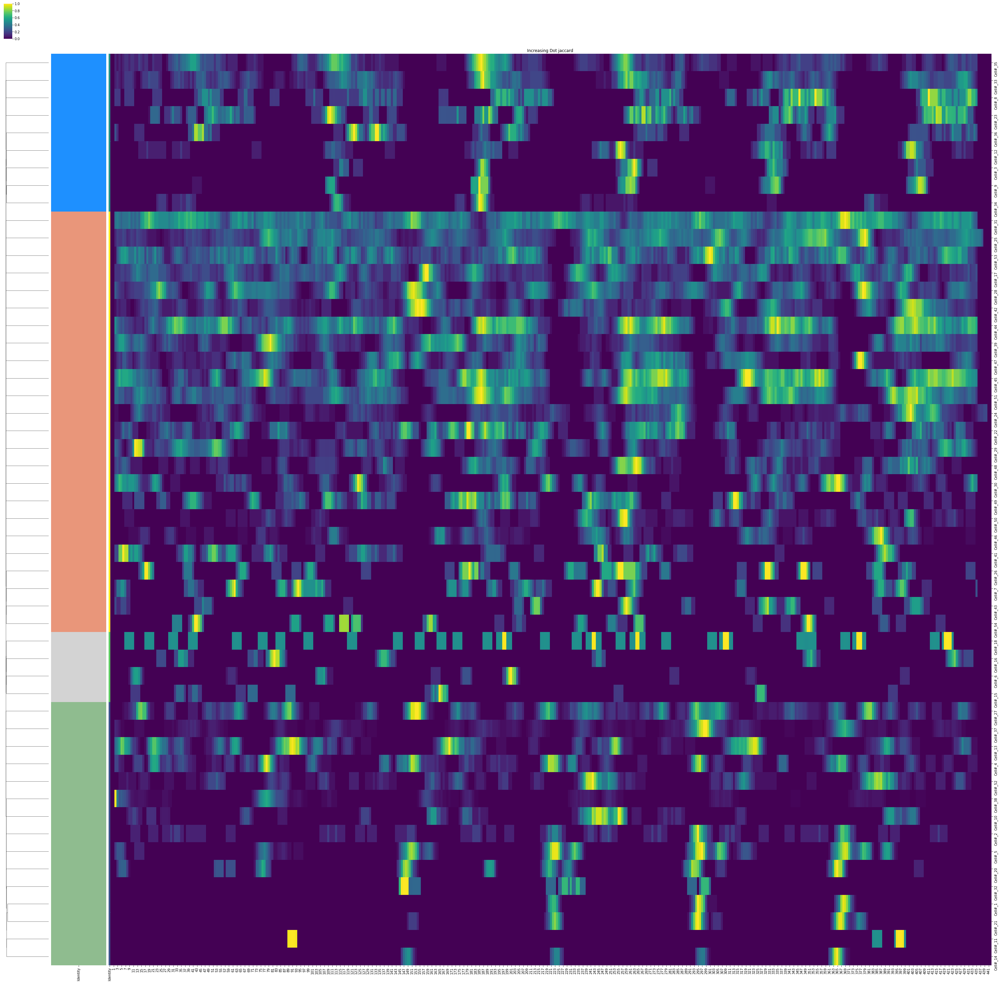

In [8]:
ClusterSingleMovie('Increasing Dot', 'Flrt3-Cre-Tom',False, 'Cell#', 'Smooth',0, True)

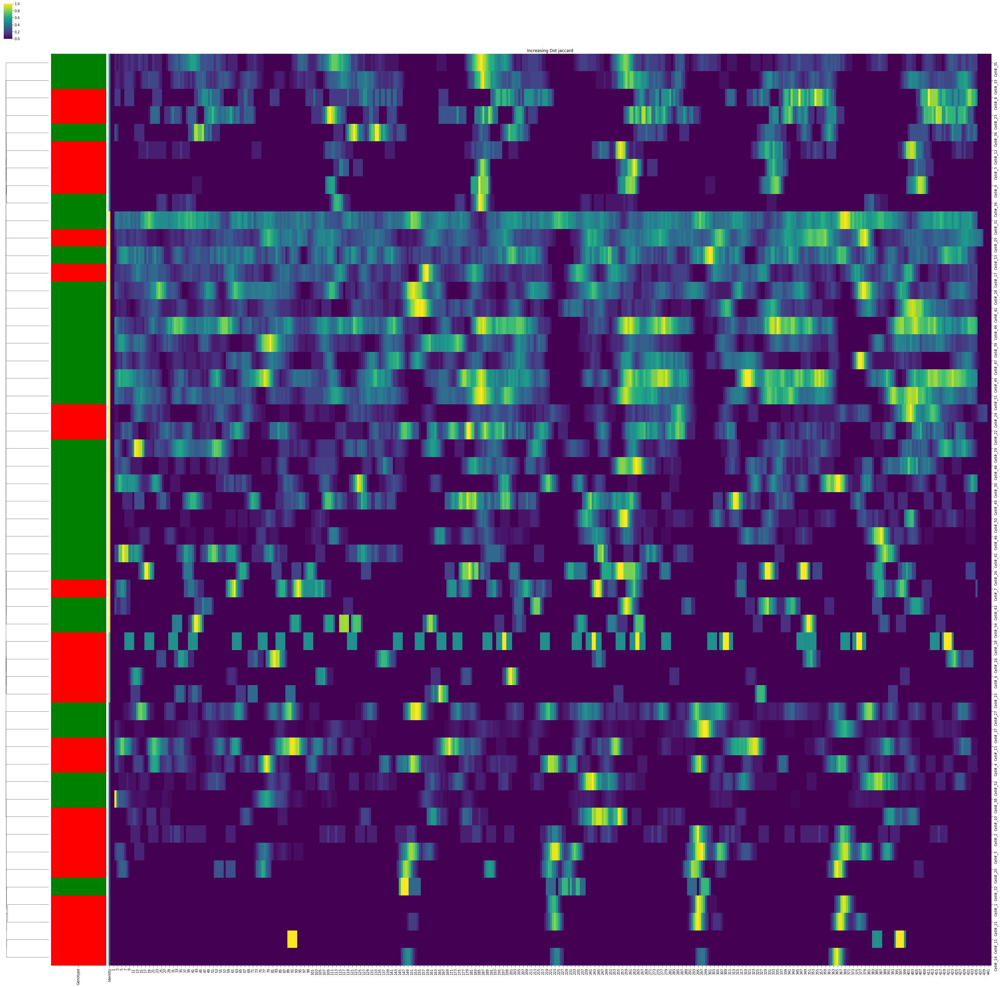

In [6]:
ClusterSingleMovie('Increasing Dot', 'Flrt3-Cre-Tom',False, 'Cell#', 'Smooth',0, True)

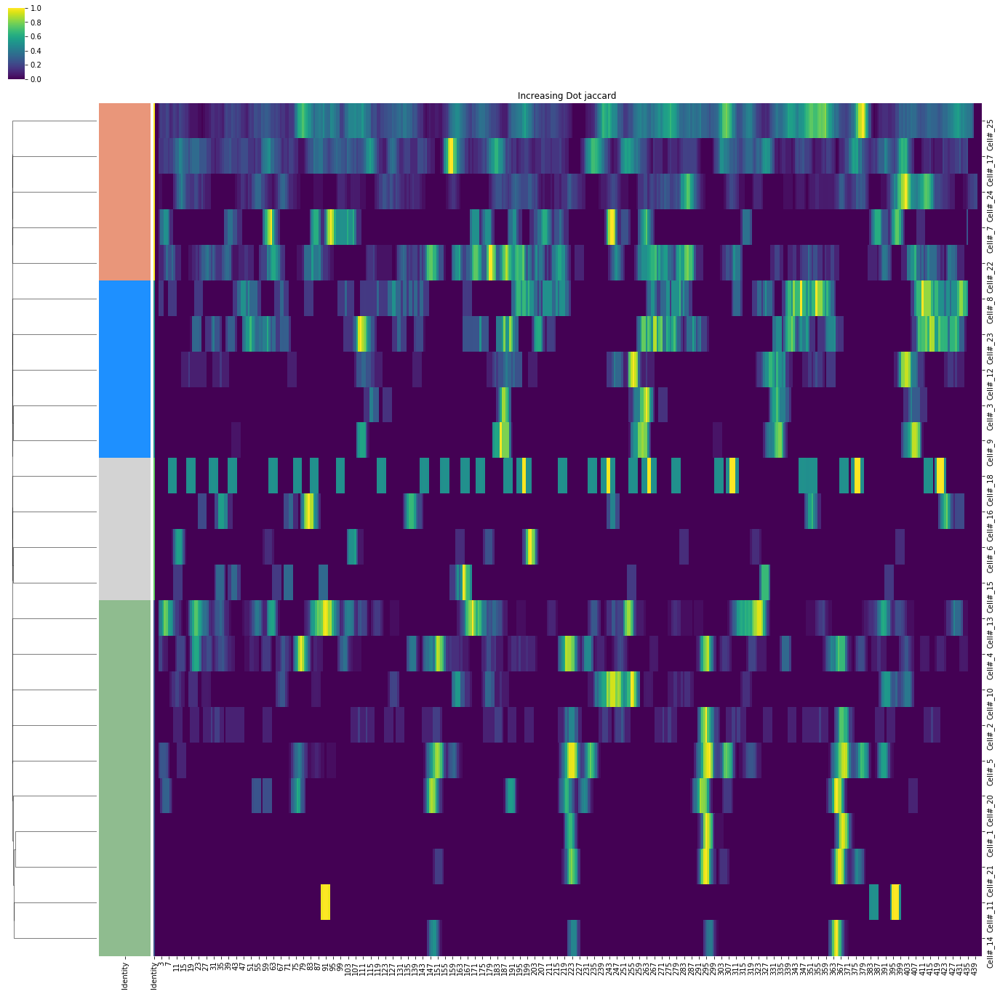

In [7]:
ClusterSingleMovie('Increasing Dot', 'Flrt3-Cre-Tom' ,True , 'Cell#', 'Smooth',0, True)

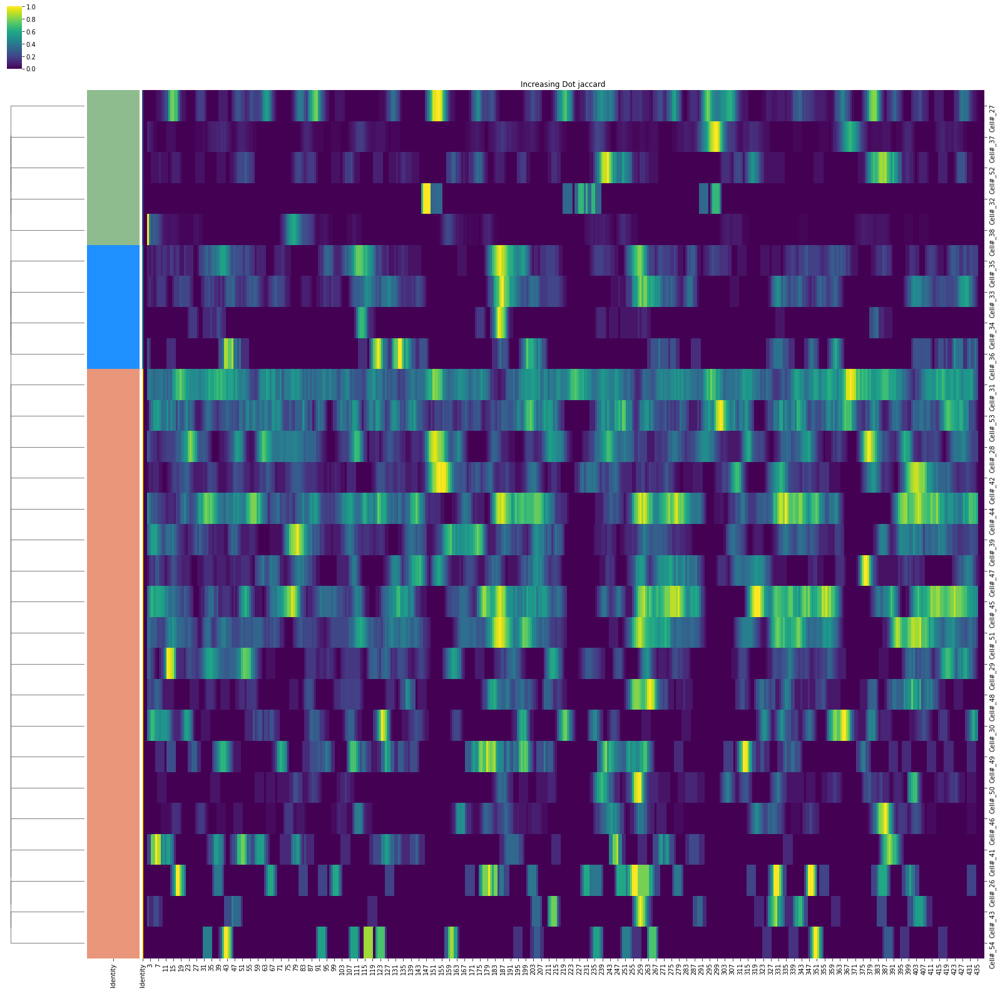

In [8]:
ClusterSingleMovie('Increasing Dot', 'Thy1-Flrt3-Cre' ,True , 'Cell#', 'Smooth',0, True)

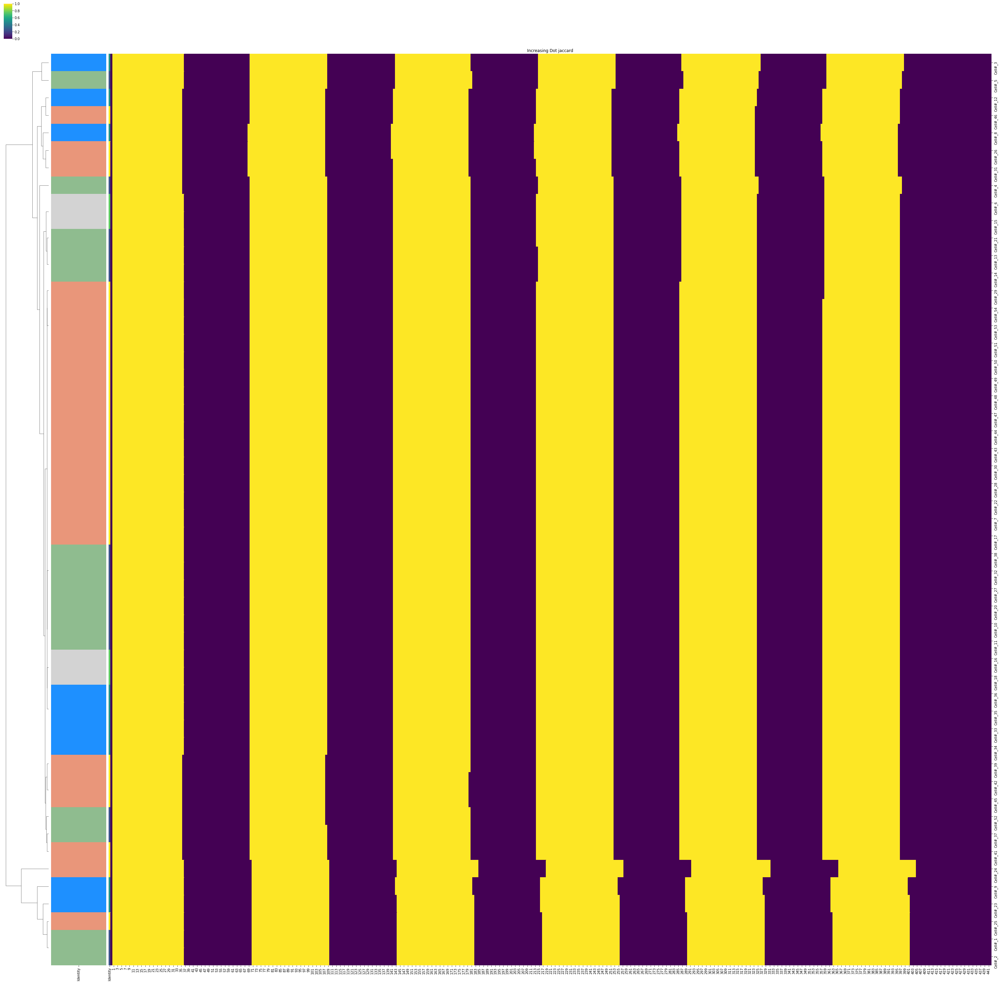

In [9]:
ClusterSingleMovie('Increasing Dot', 'Flrt3-Cre-Tom',False, 'Cell#', 'Stimulus',0, True)

1468


()

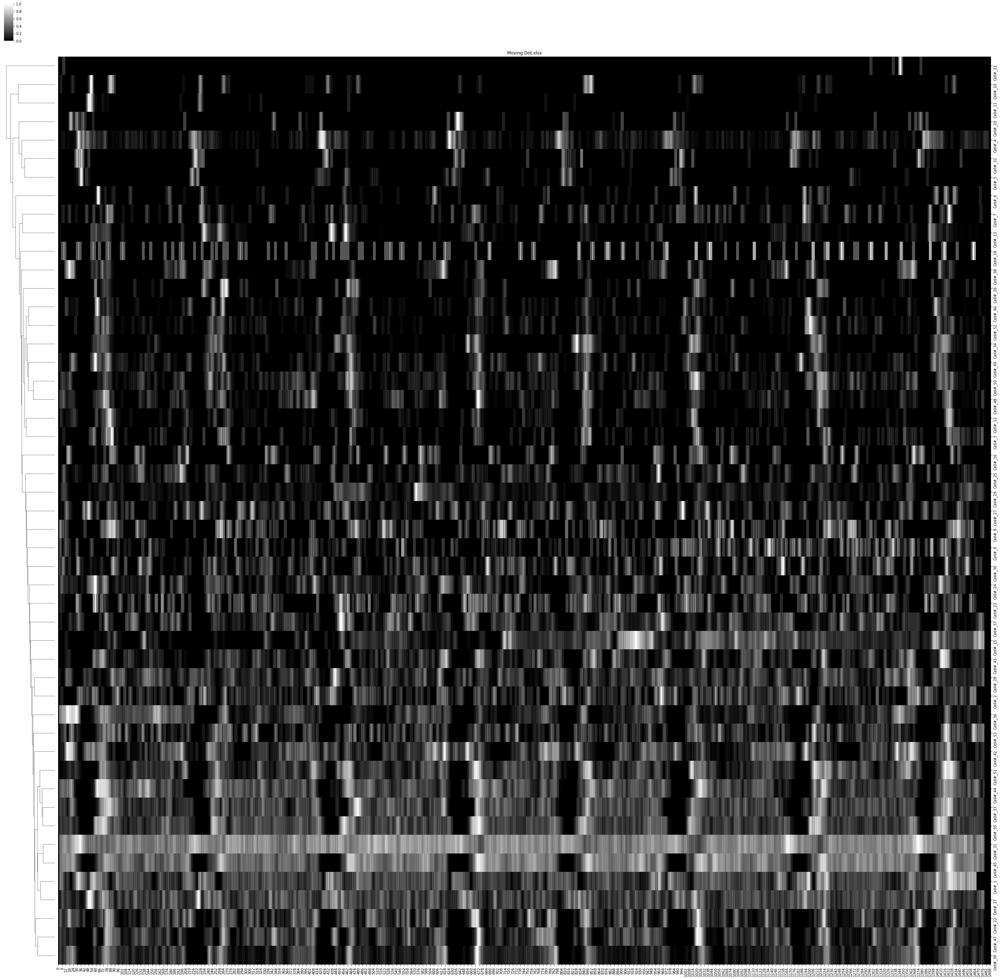

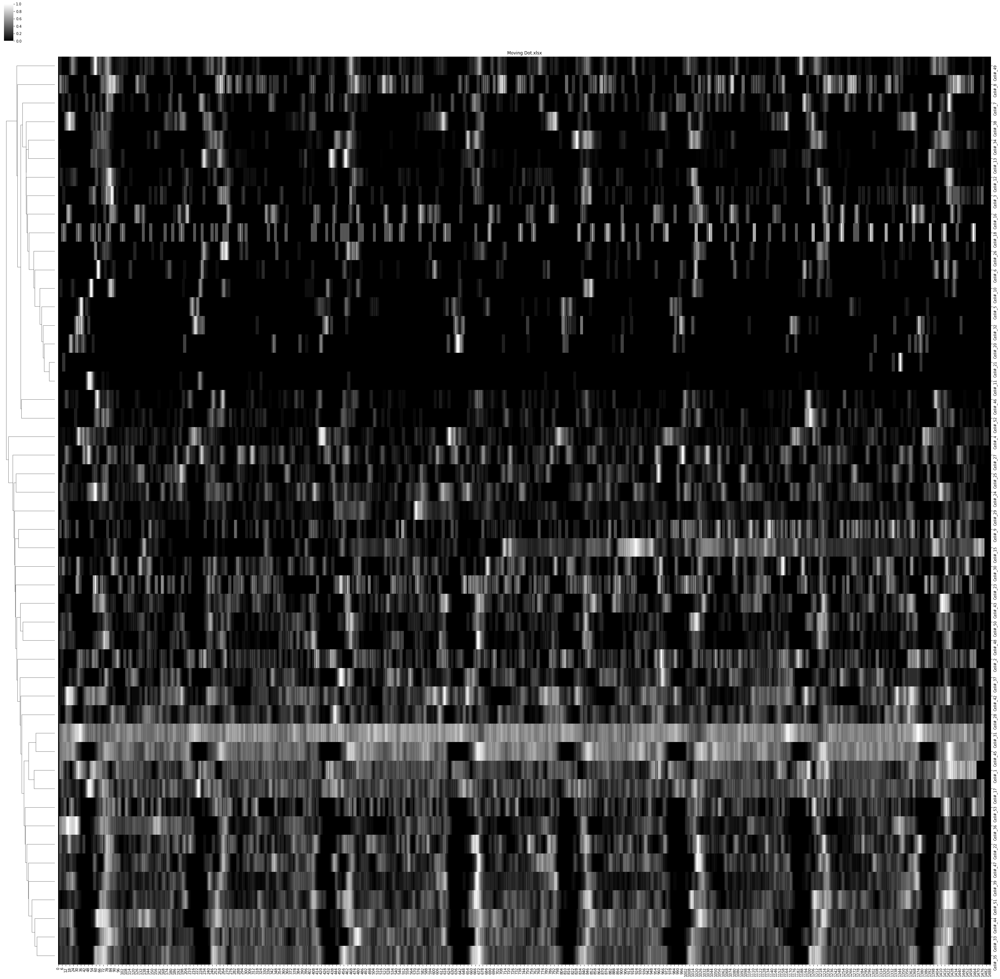

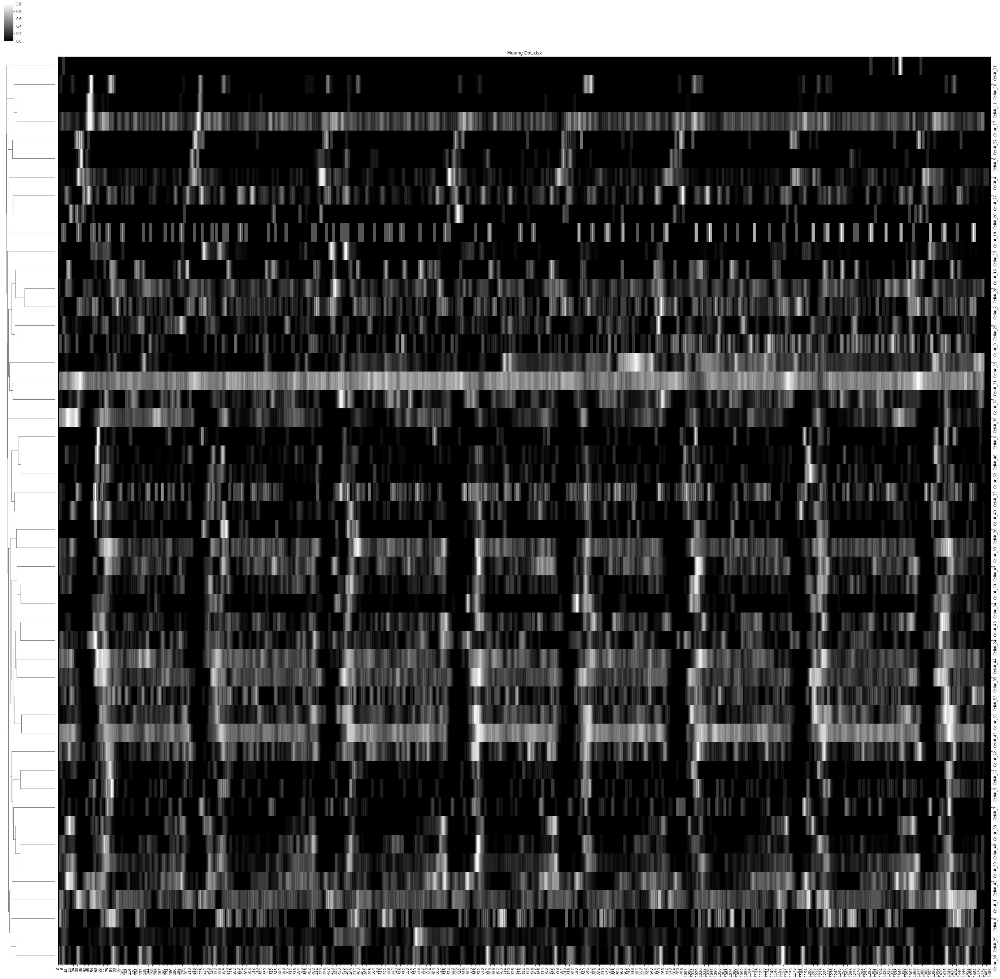

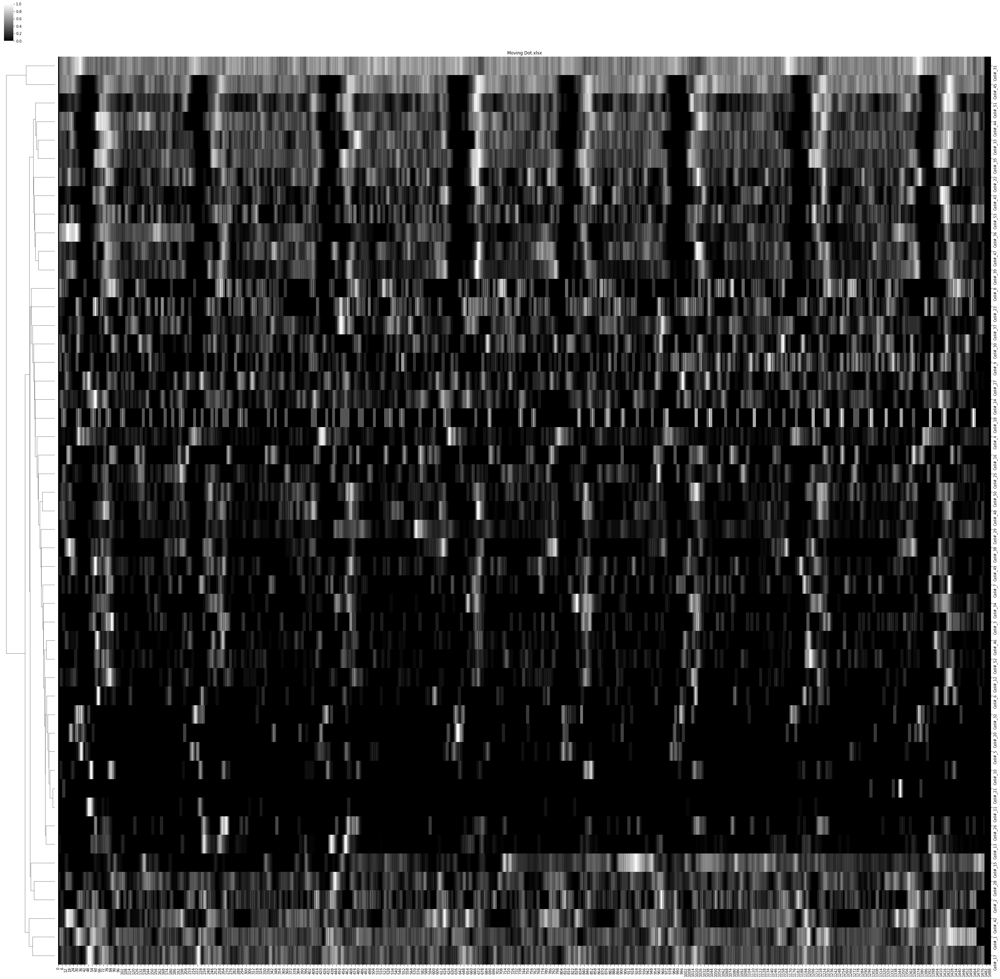

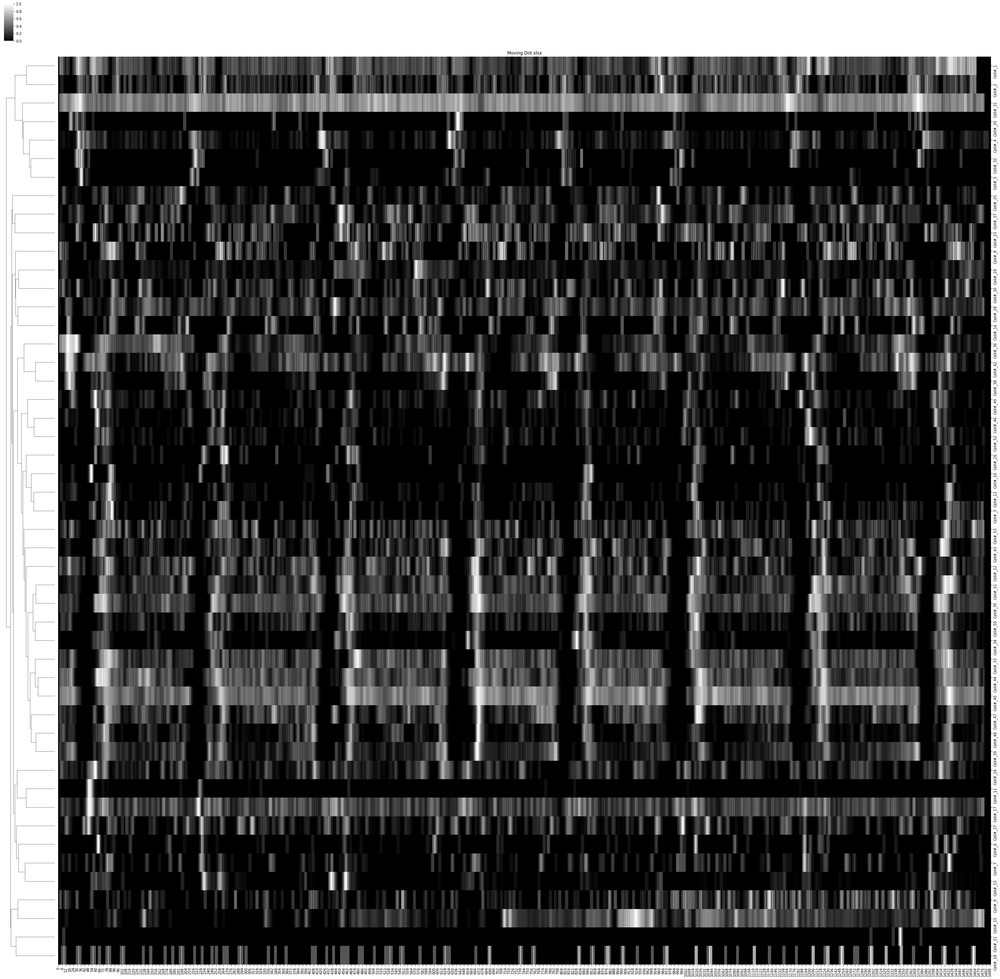

...

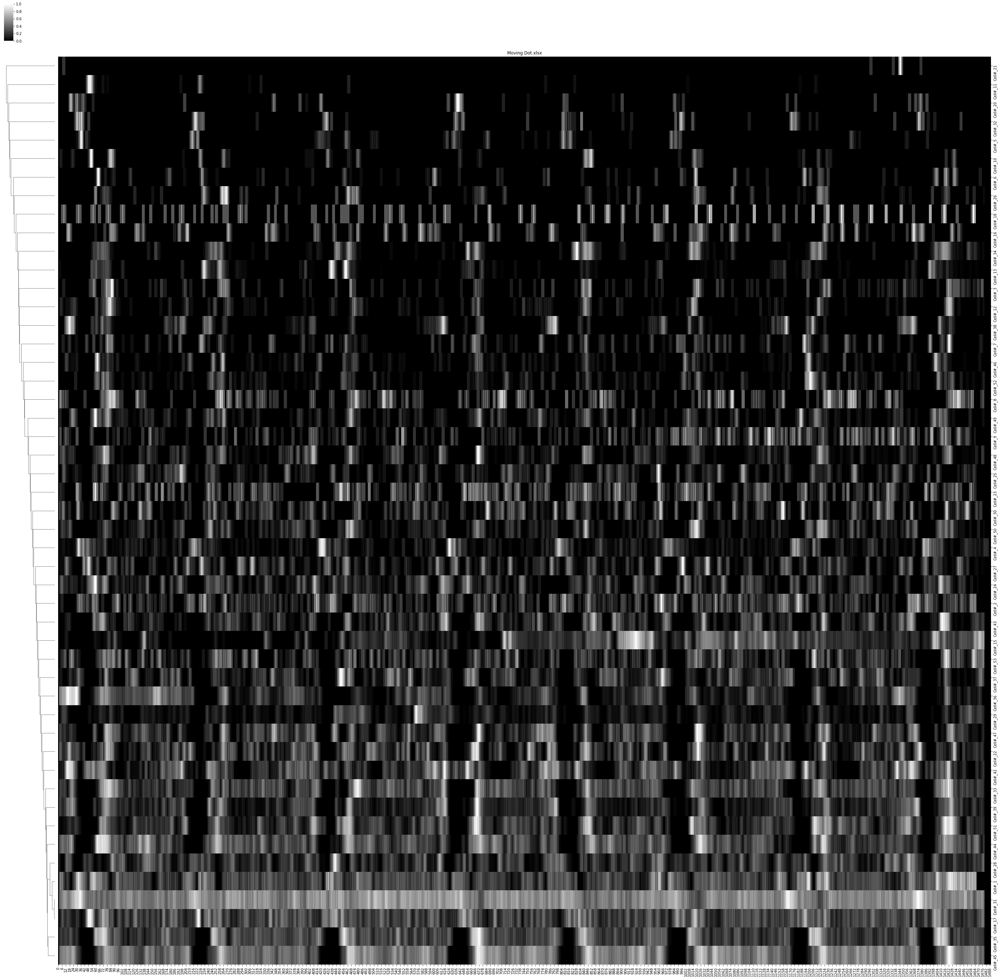

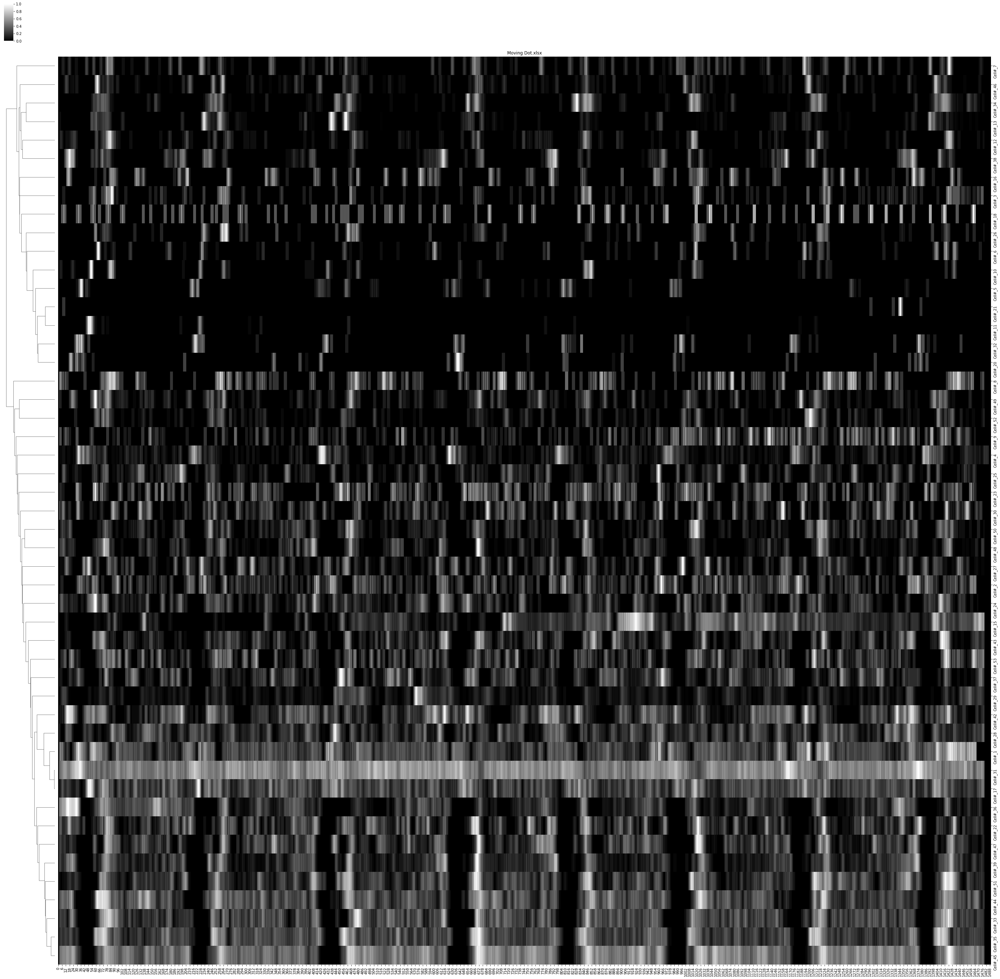

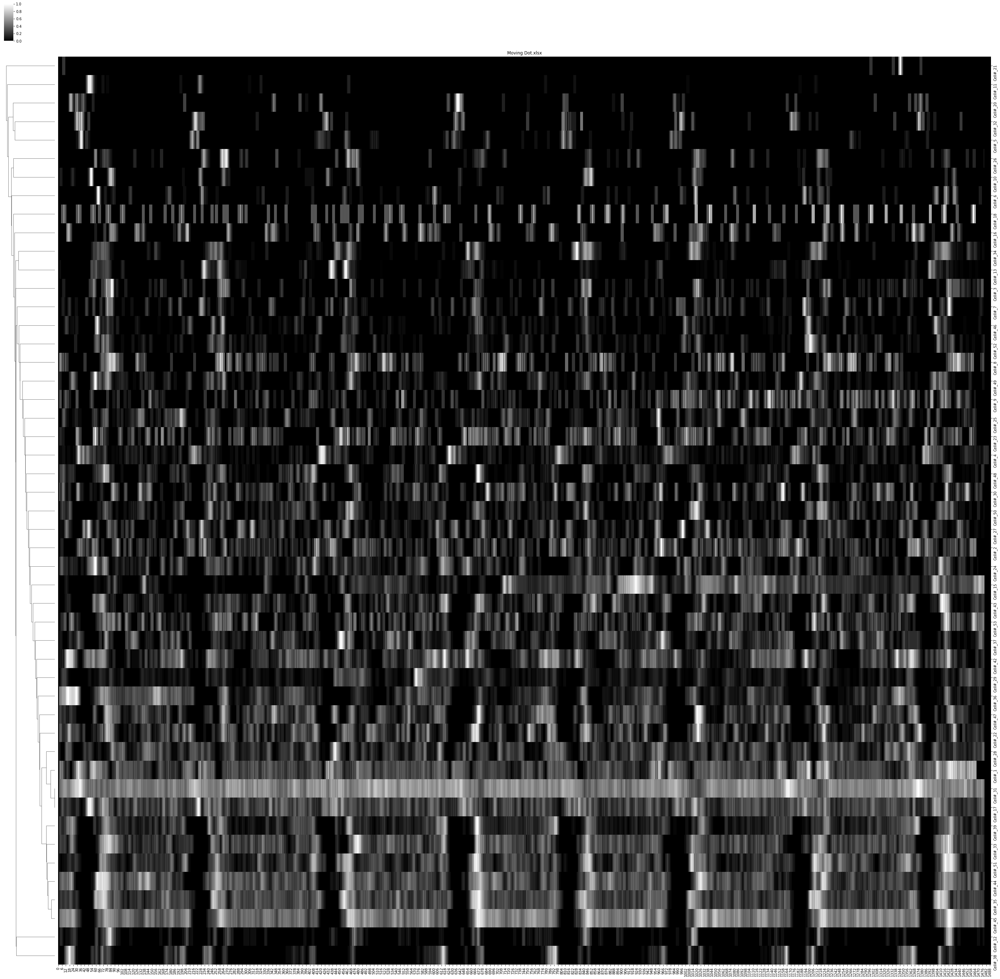

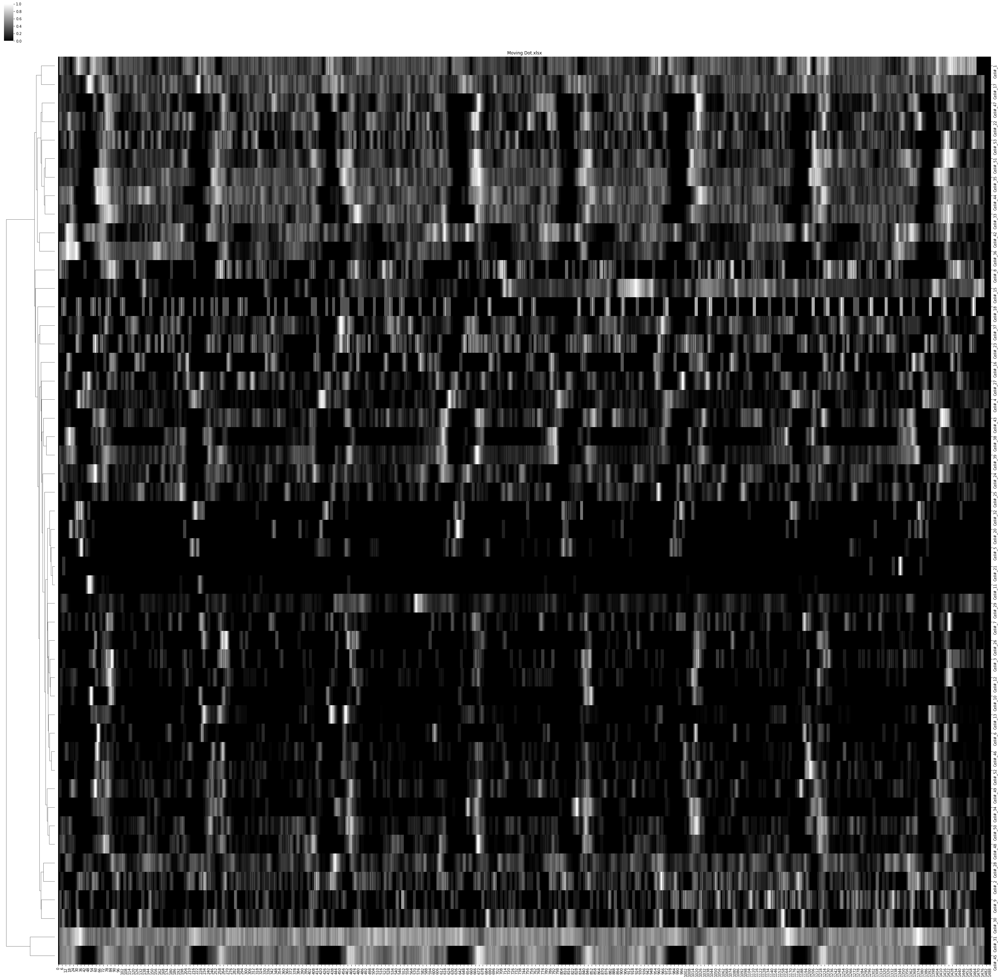

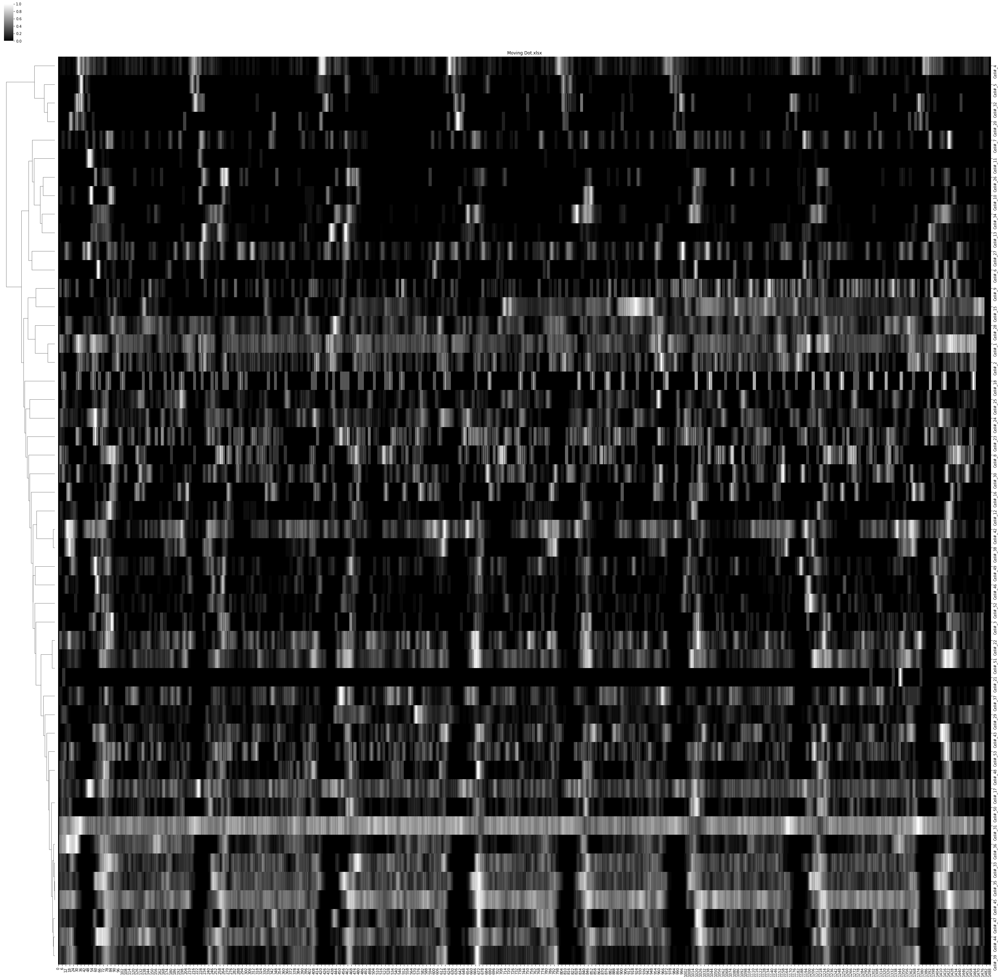

In [73]:
ClusterSingleMovie('Moving Dot.xlsx', 'Cell#', 'Smooth',0)

4235


()

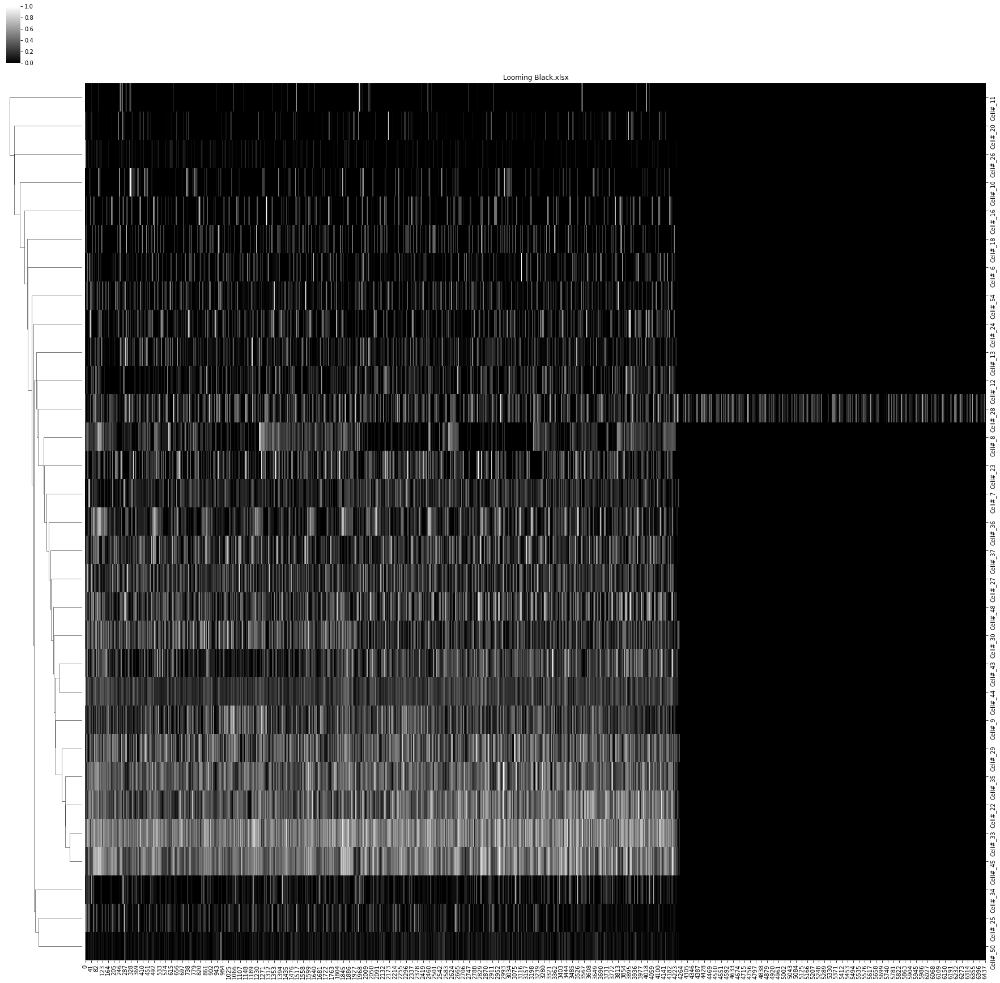

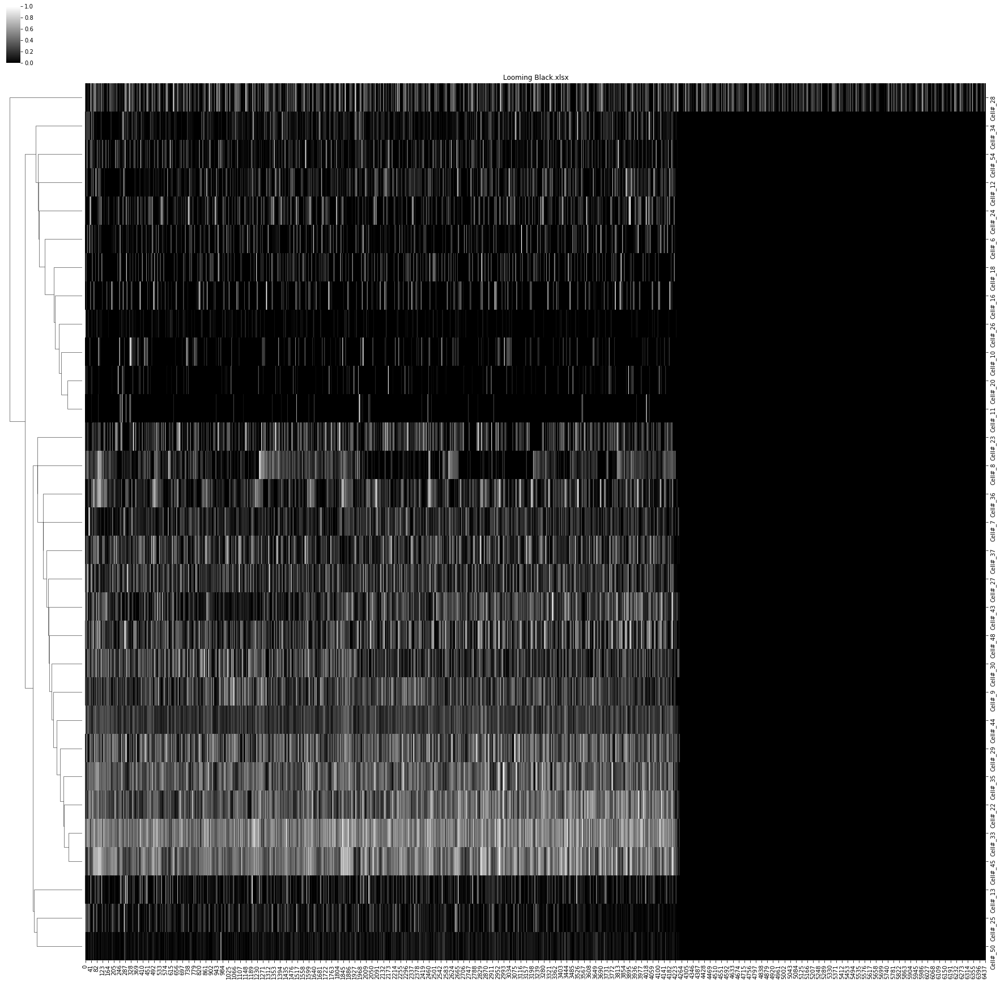

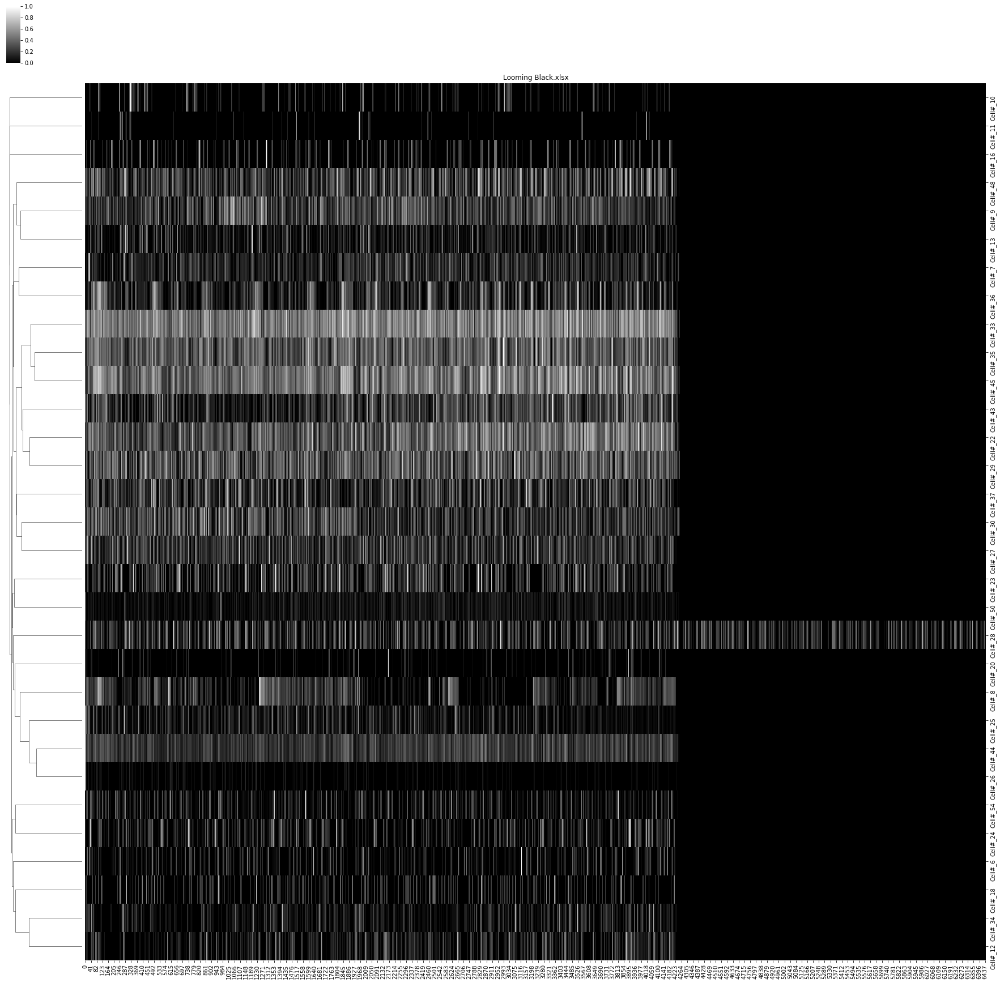

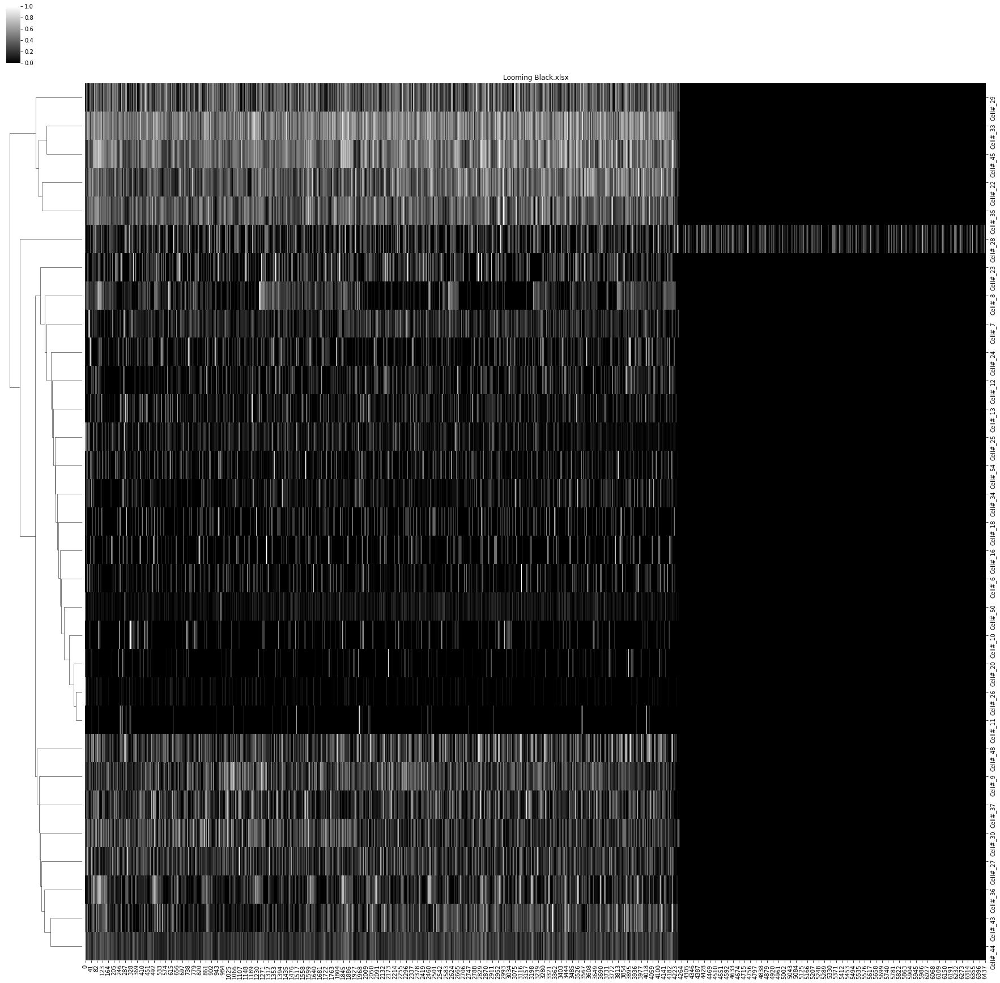

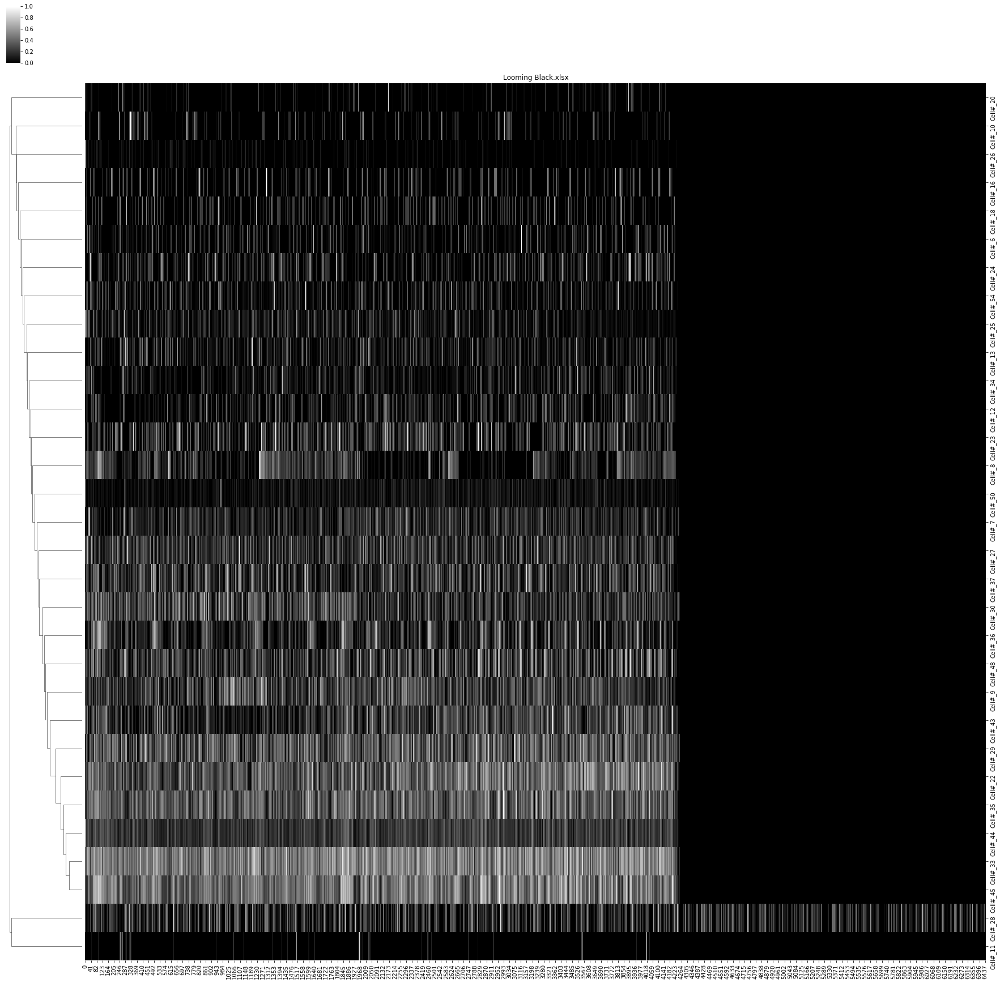

...

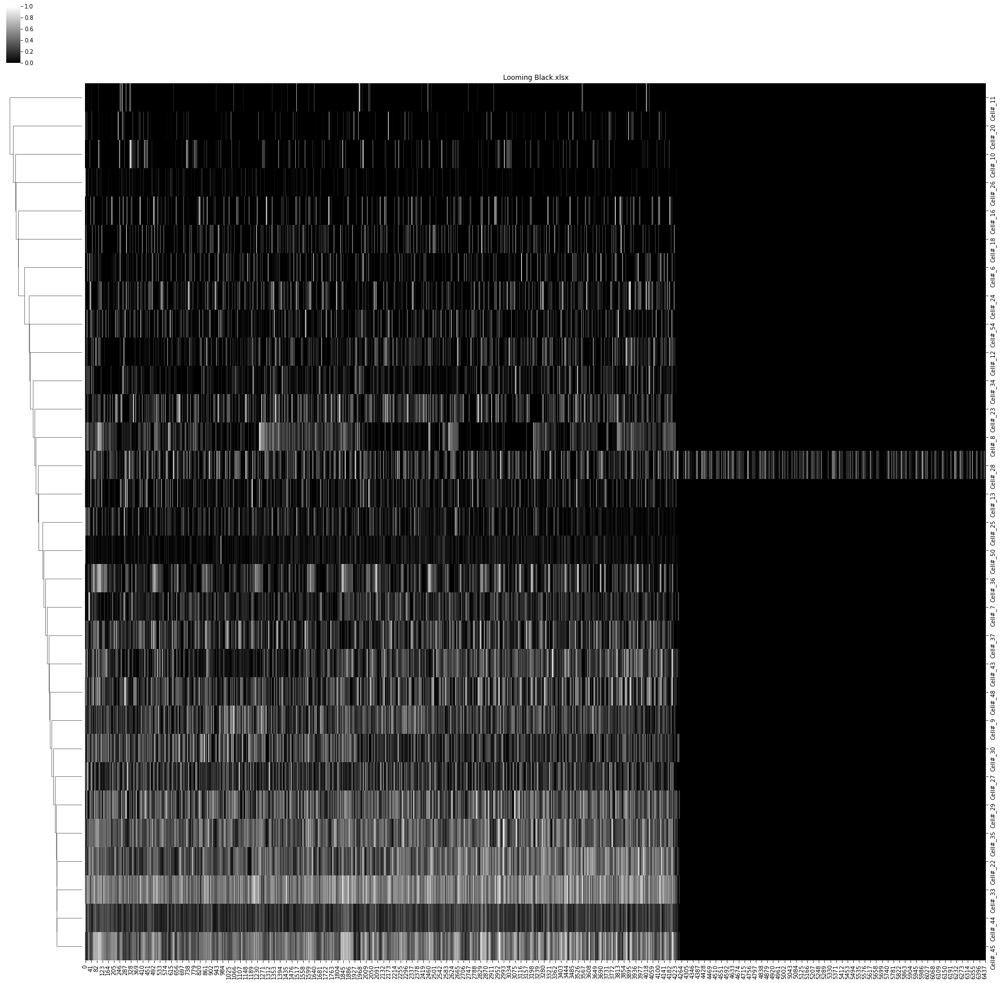

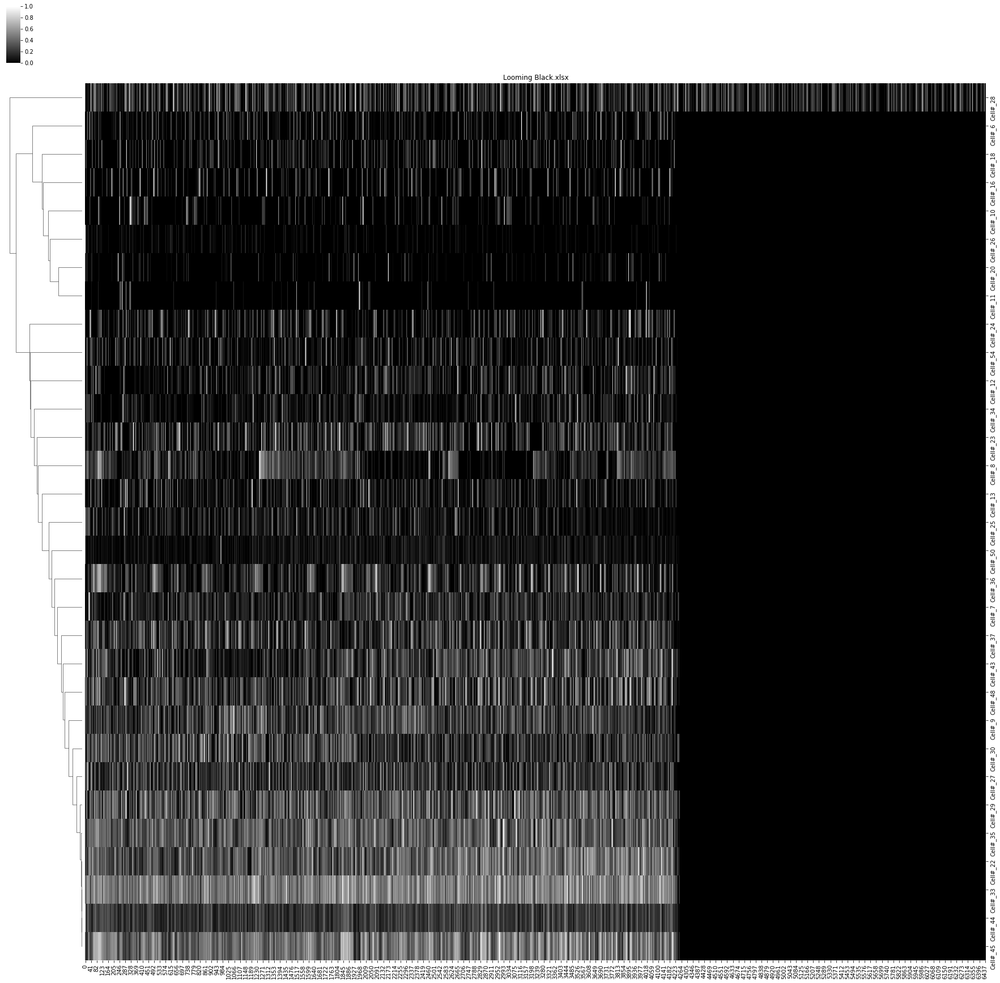

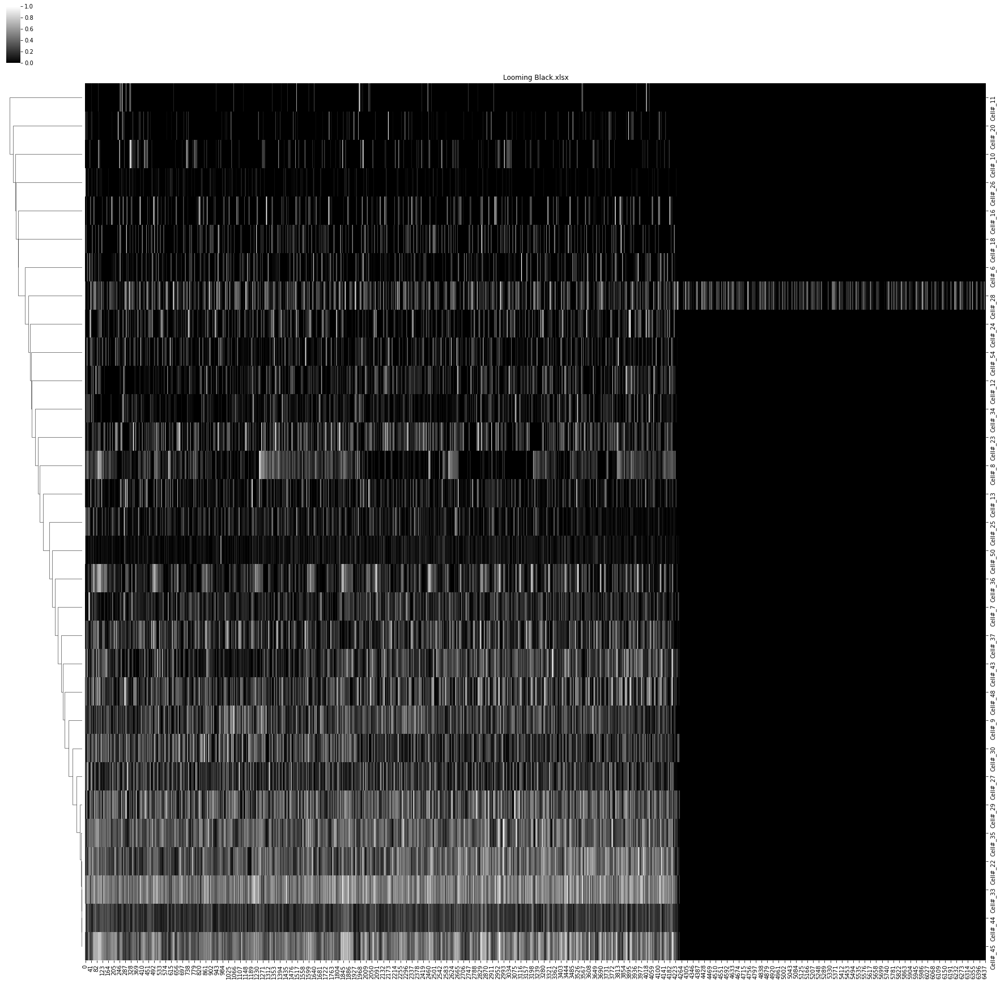

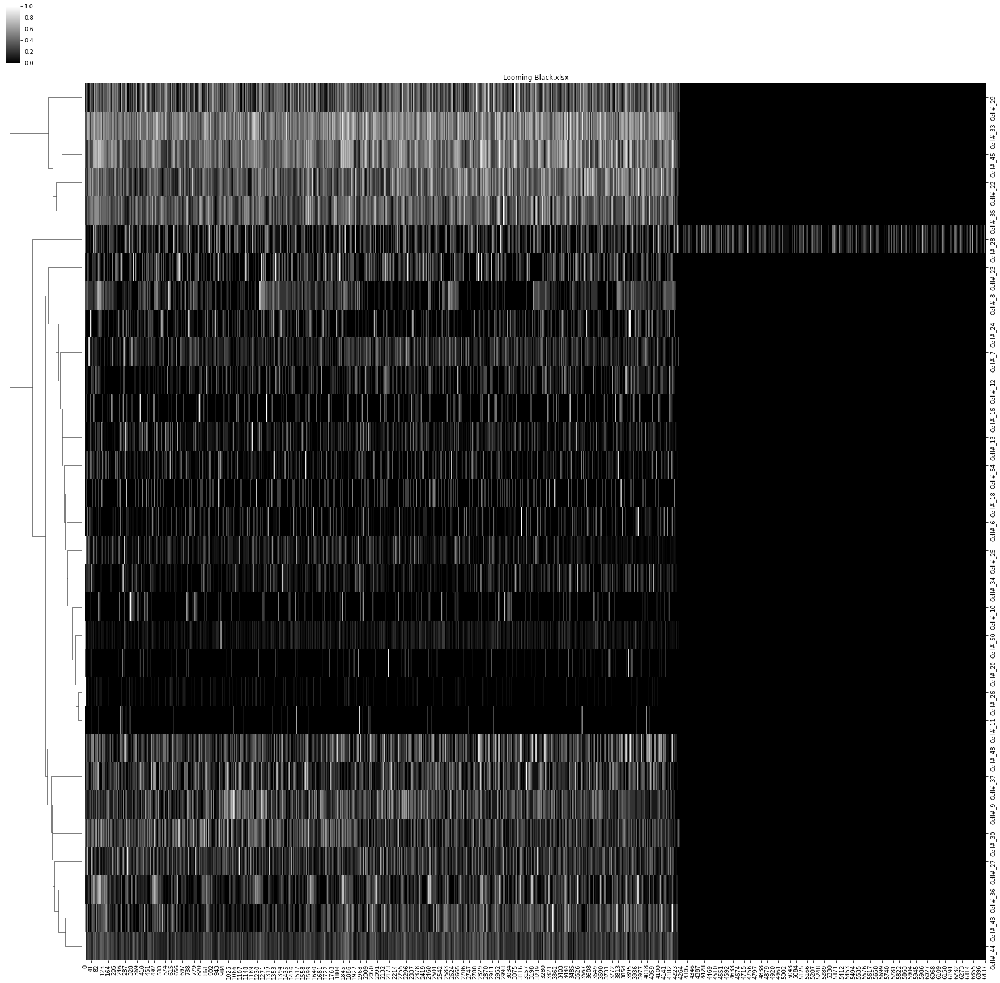

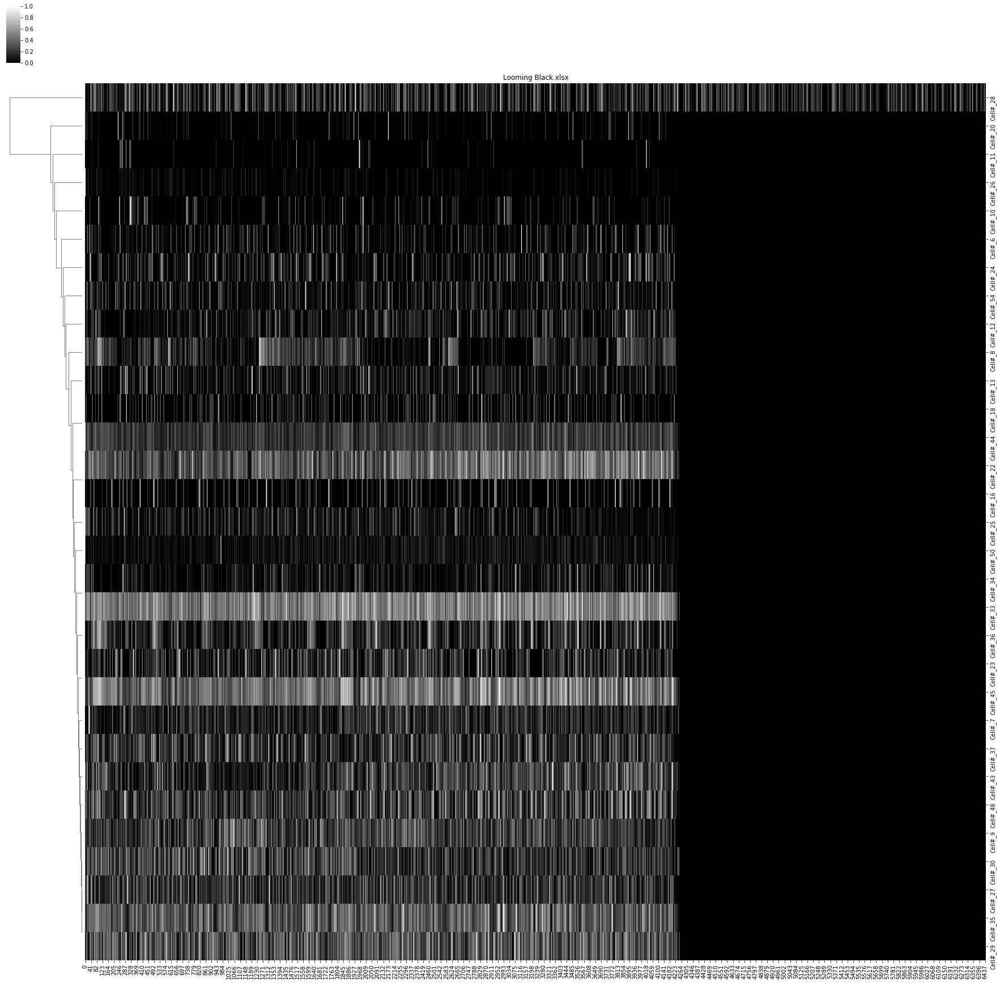

In [75]:
ClusterSingleMovie('Looming Black.xlsx', 'Cell#', 'Smooth',0)

4235


()

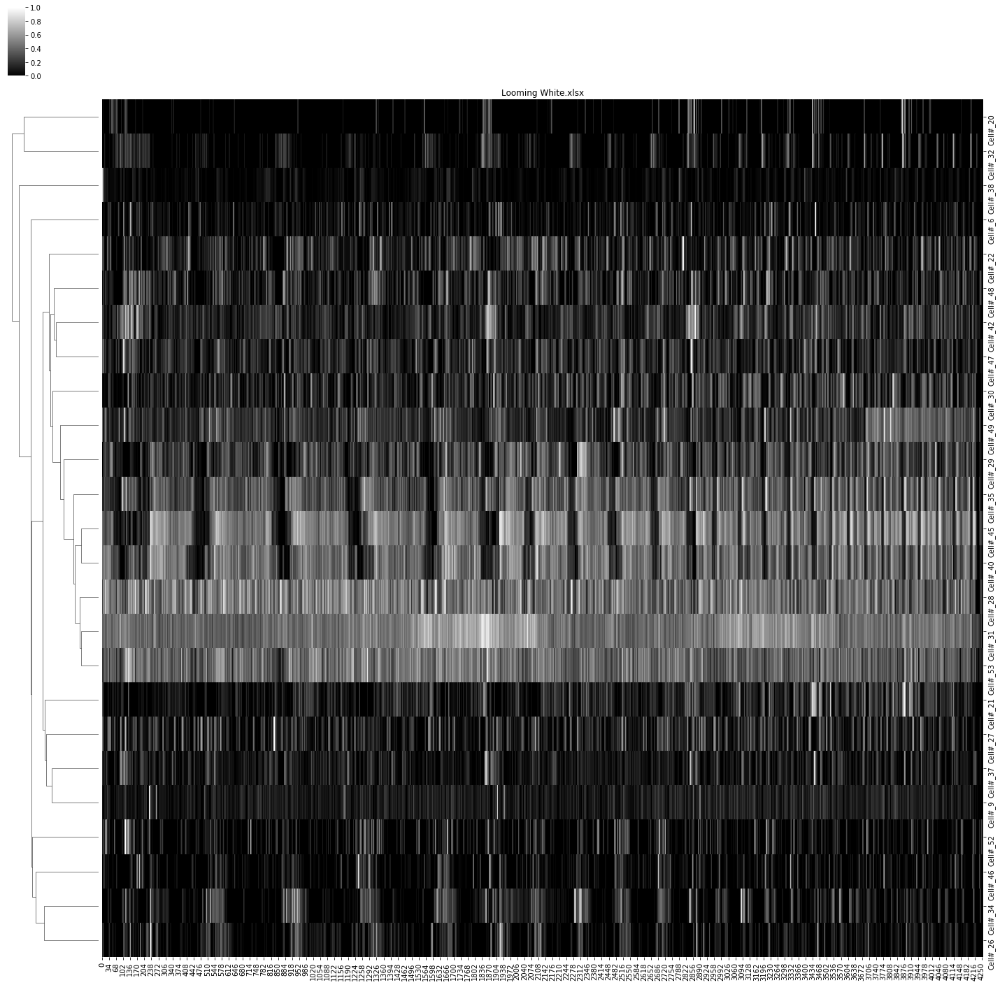

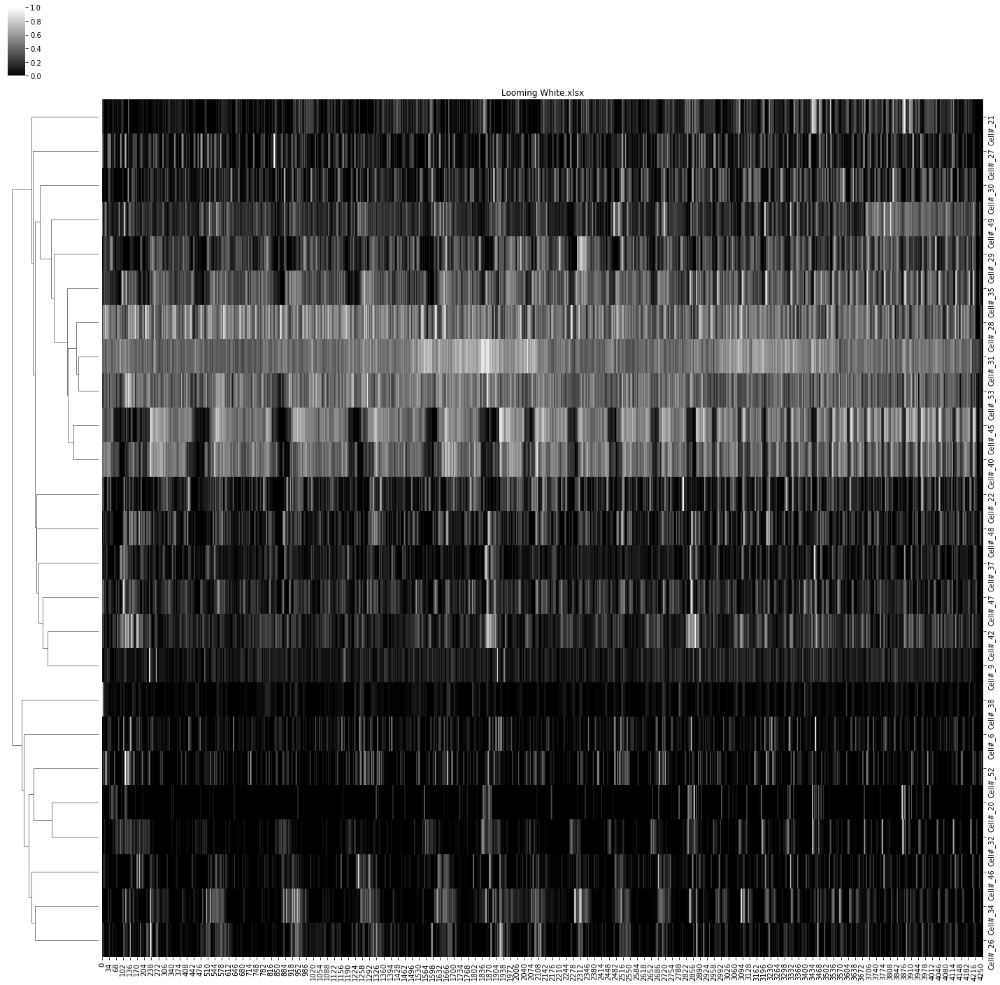

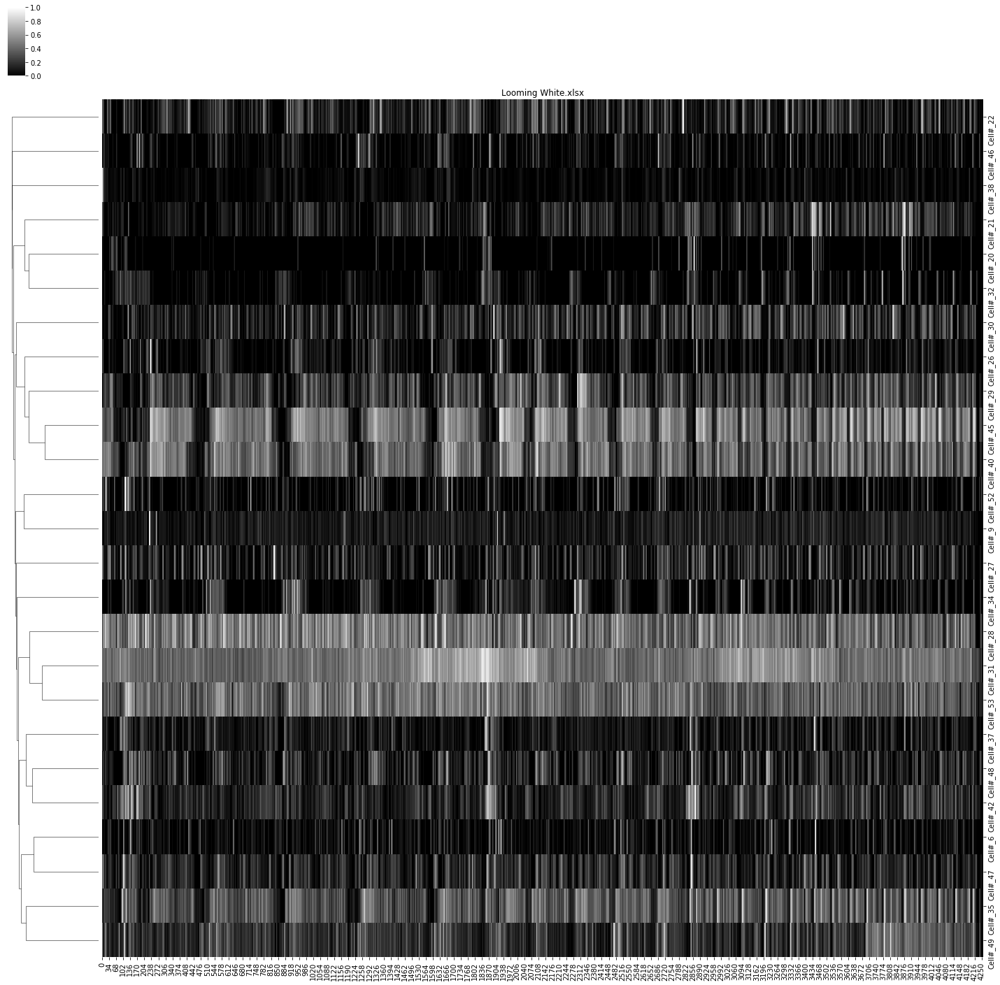

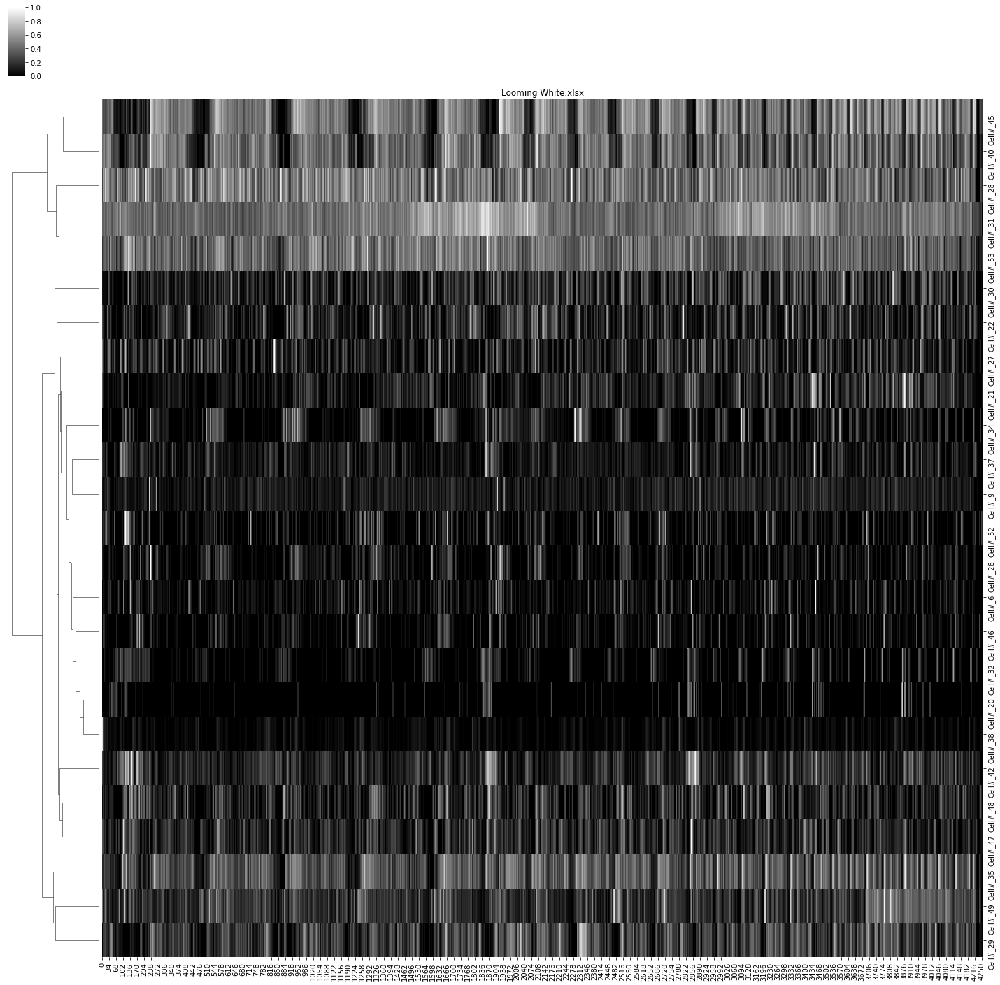

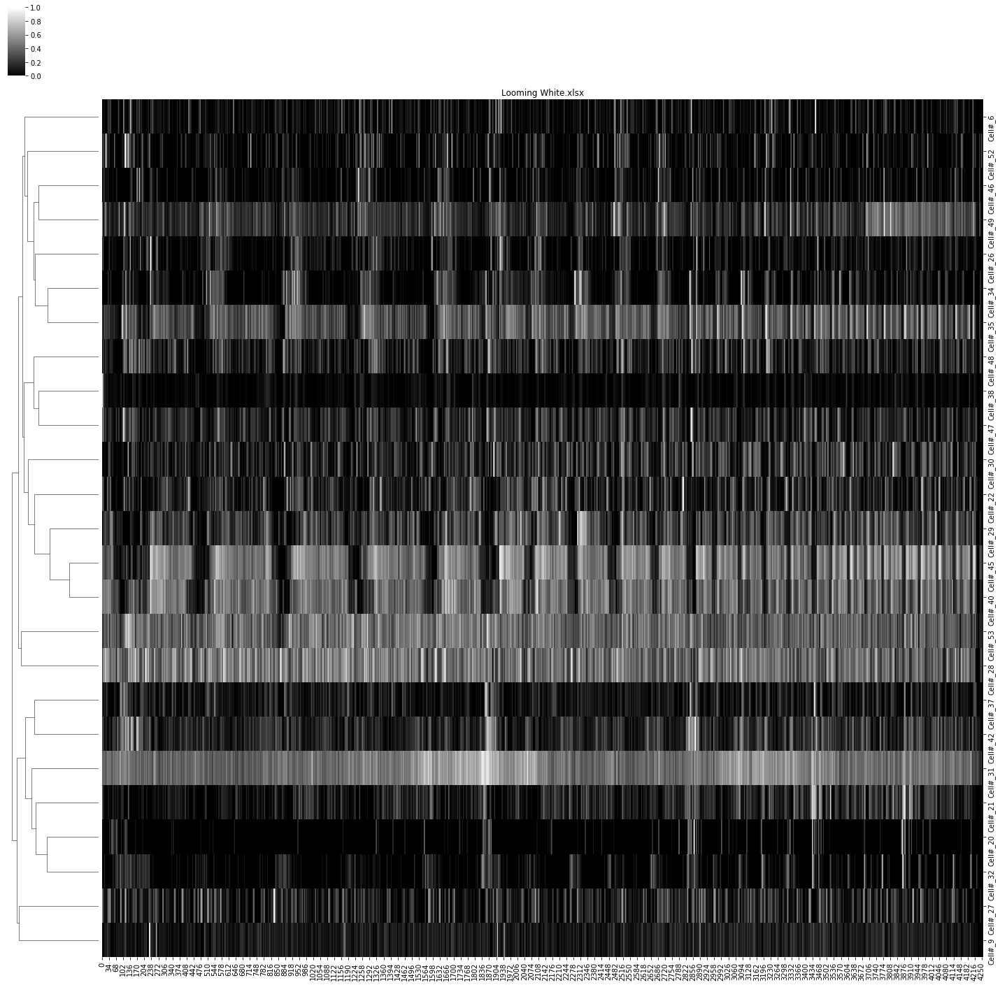

...

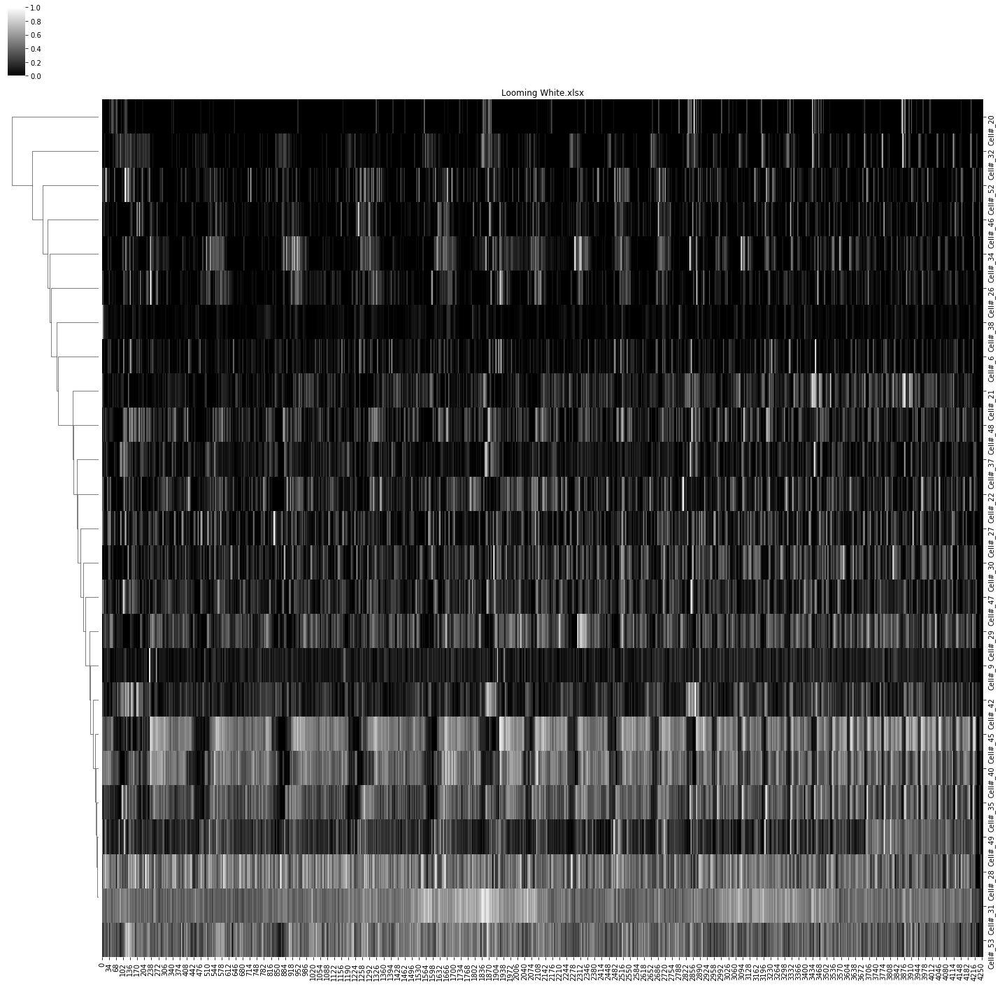

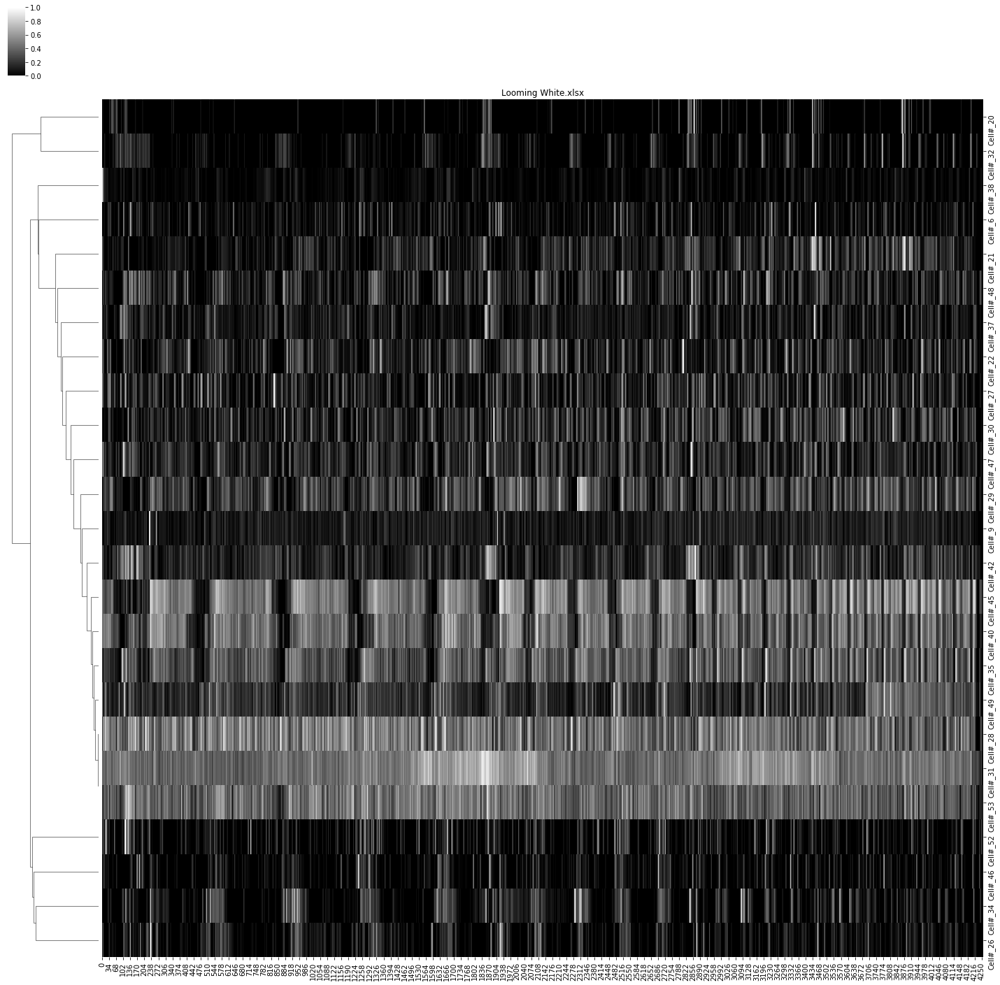

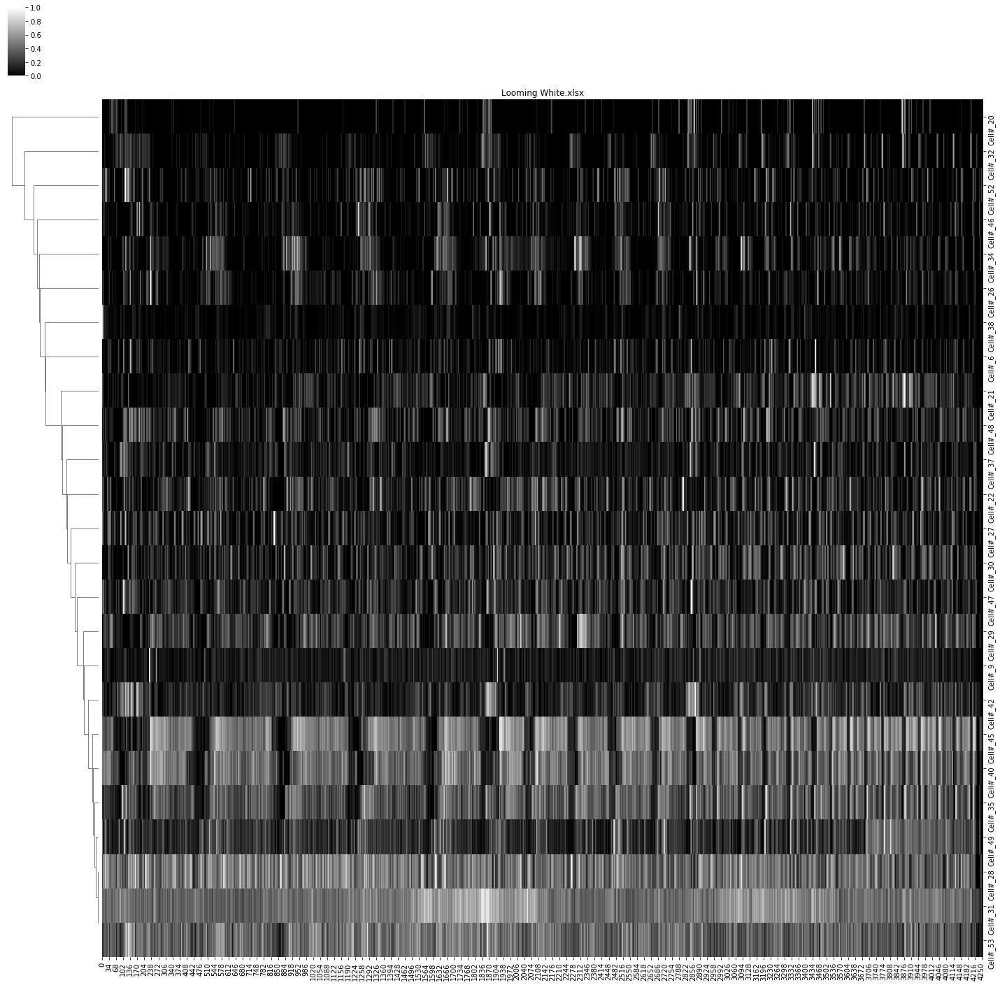

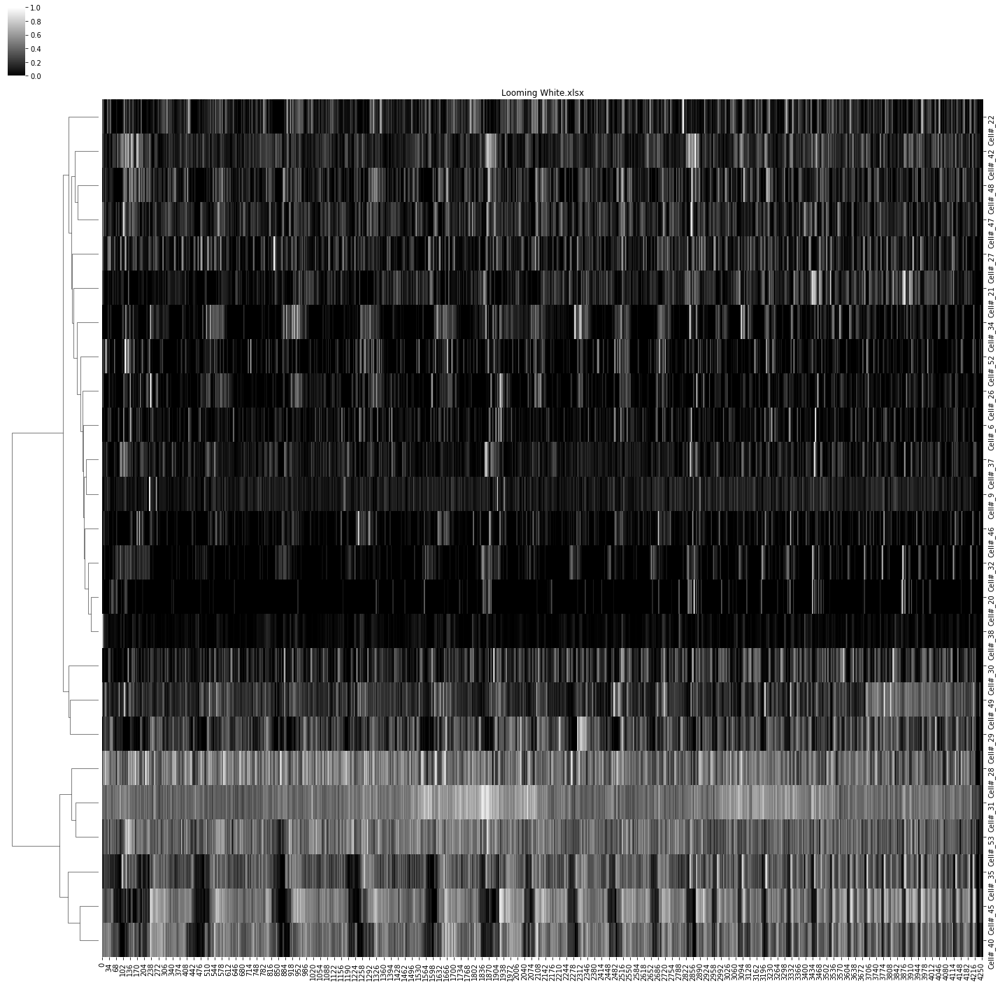

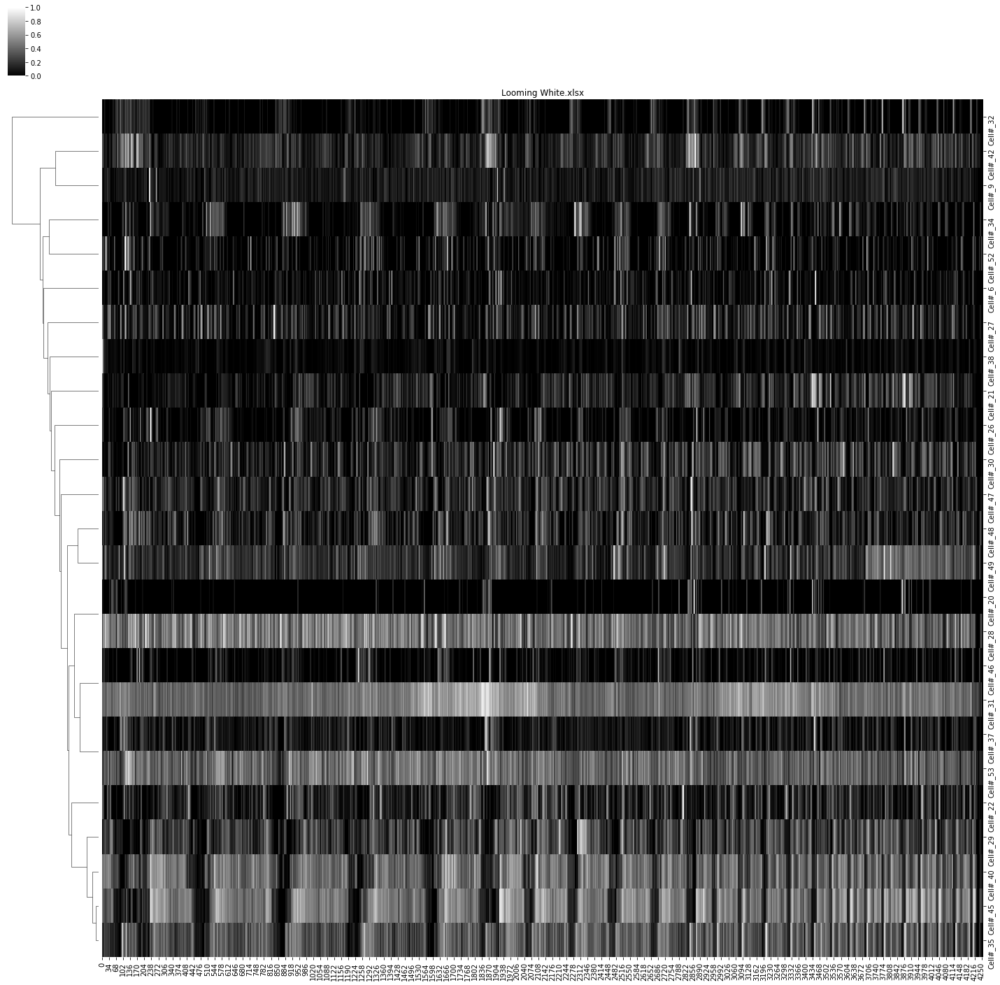

In [77]:
ClusterSingleMovie('Looming White.xlsx', 'Cell#', 'Smooth',0)

In [249]:
#Simply plots all data as lineplot with smoothing algorithm and returns figure + underlying data as xlsx file
def Lineplot ():
    #bins_ms: Enter bin size of data to define plot dimensions
    import matplotlib.patches as patches
    metadata = pd.read_excel(os.getcwd() + '/Input/Metadata.xlsx') #Open Metadatafile
    wd = os.getcwd() + '/temp/'
    files = os.listdir(wd)
    newlist = []
    for names in files:
        if names.startswith("absoluteTime"):
            newlist.append(names)
    files = newlist
    for file in files:
        data = pd.read_excel(wd+str(file))
        
        #Determine start and stop times
        start = data['Time_s'][data['Start_Stop']==1].reset_index()
        stop = data['Time_s'][data['Start_Stop']==-1].reset_index()   
       
        plt.figure(figsize=(0.4*max(data['Time_s']),2)) #0.4/sekunde
        ax=sns.lineplot(data = data, y='Smooth',x='Time_s',color='black',linewidth=2)
        #ax=plt.fill_between(data.Smooth, data.Smooth + data.STD, data.Smooth-data.STD, color='gray', alpha=0.2)
        
        for i in range(len(start)):
            # Add rectangle
            ax.add_patch(patches.Rectangle(xy=(start.Time_s[i],0), width=stop.Time_s[i]-start.Time_s[i], height=max(data.Stimulus),alpha=0.3, facecolor="grey", linewidth=1, linestyle='solid'))

        ax.set(xlabel='Time (s)', ylabel='Firing rate (Hz)', title= 'Cell#'  + str((data['Cell#'][0])) + ' ' + str(data.Movietype[0]))
        sns.despine(top=True, right=True, offset=10)
        
        plt.savefig(os.getcwd() + '/Output/' + 'Cell#_' + str((data['Cell#'][0])) + ' Lineplot ' + ' ' + str(data.Movietype[0]) + '.png',dpi=300,bbox_inches='tight')
        #data.to_excel(os.getcwd() + '/Output/' + 'Cell#_' + str((data['Cell#'][0])) + ' Lineplot ' + ' ' + str(data.Movietype[0]) + '.xlsx')

KeyboardInterrupt: 

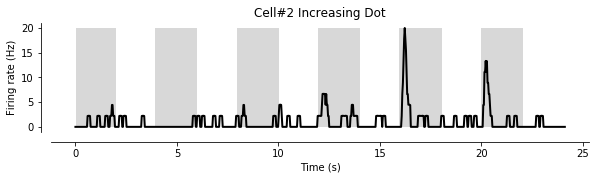

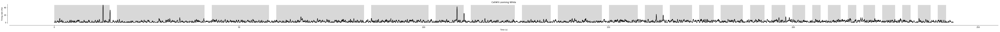

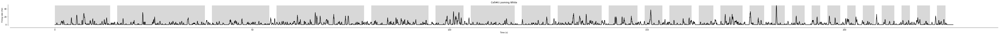

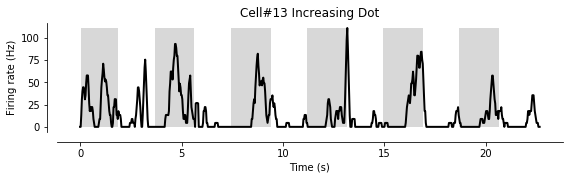

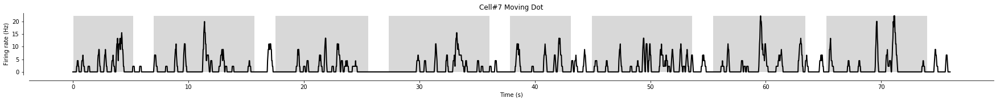

...

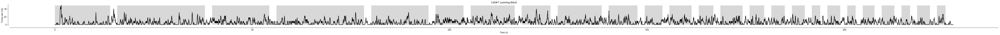

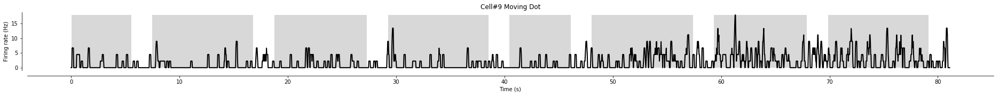

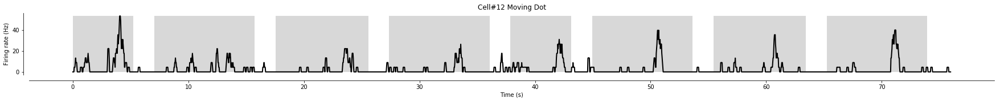

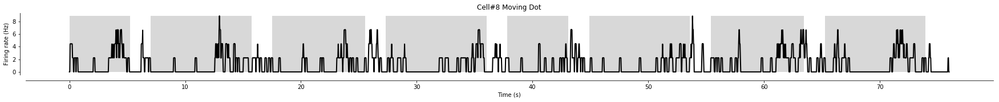

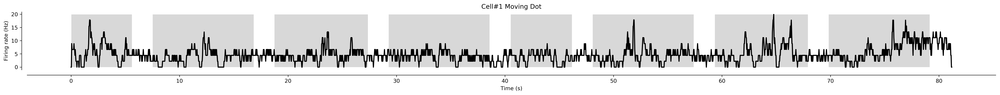

In [49]:
Lineplot() 

In [214]:
#Determines direction selectivity index and plots direction selectivity as Polarplot
#Sequence: Takes smoothed Trial data and determines maximum for each stimulus direction. 2. 
def DirectionSelectivity (movietype, genotype, identity, save):
    import os
    import pandas as pd
    import numpy as np
    import matplotlib.pyplot as plt
    import math as m
    import time as t
    #Define functions here####
    def angle_radius (x,y):
        #Calculates angle and radius from 2D Vector (Input: X,Y coordinates)
        if y >= 0:
            if x >= 0:
                radians=(np.tanh(abs(y/x))) + np.radians(0)
            else:
                radians = np.radians(180) - (np.tanh(abs(y/x)))
        else:
            if x >= 0:
                radians = np.radians(360) - (np.tanh(abs(y/x)))
            else:
                radians = (np.tanh(abs(y/x))) + np.radians(180)
        radius = np.sqrt(x**2 + y**2)
        return(radians,radius)
    
    def Polarplot (data, output, directionCol, averageCol, radiusCol, trialCol, DSICol, DSIVectCol, OSCol):
        #Plotting the data of smoothed or non-smoothed data
        #multiple: If true all plots will be comibined into one png file
        colors = ['red','green','blue','yellow','grey']
        ax = plt.figure(figsize=(5,5),dpi=100)
        ax = plt.subplot(111, projection='polar')
        ax.plot(output['directions'], output[averageCol], color = 'black', linewidth = 4)
        for g in trialnumber:
            ax.plot(output['directions'], output[trialCol + str(g)], color = colors[g], linewidth = 2, alpha=0.1)
        #Plot Vector sum vector
        theta = [output[directionCol][0],output[directionCol][0]]
        r = [0,output[radiusCol][0]]
        ax.plot(theta,r, color = 'red', linewidth = 3) #Plot Direction Vector
        ax.set_yticklabels([])
        ax.set_title('Cell#'  + str((data['Cell#'][0])) + ', ' + str(data.Movietype[0]) + ', DSI=' + str(output[DSICol][0]) + ', DSI_Vector=' + str(output[DSIVectCol][0])+ ', OSI=' + str(output[OSCol][0]), va='bottom',fontweight='bold')
        ax.set_rticks([])
        plt.savefig(os.getcwd() + '/Output/' + 'Cell#_' + str((data['Cell#'][0])) + ' Polarplot ' + str(data.Movietype[0]) + '.png',dpi=300,bbox_inches='tight')
    
    def DSI_Vector_based(dfx,dfy):
        #Calculate DSI from vectors
        #Input x,y represent columns of pandas dataframe
        x = dfx.sum(axis=0)
        y = dfy.sum(axis=0)
        radius = np.sqrt(x**2 + y**2)
        radius_total = np.sum(np.sqrt(np.square(dfx)+np.square(dfy)))
        return((radius/radius_total).round(2))
        
    #Select only Movies for Moving Dot
    #wd = os.getcwd() + '/temp/'
    #files = os.listdir(wd)
    #newlist = []
    #for names in files:
    #    if names.endswith(".xlsx"):
    #        newlist.append(names)
    #files = newlist
    #files.sort()
    filelist =[]
    metadata = pd.read_excel(os.getcwd() + '/Input/Metadata.xlsx') #Open Metadatafile
    
    #Convert angle to radians for plotting on polar plot
    angles = Movies['Moving Dot'][1]['Sequence'] #Takes angles of movie from Movies description
    radians = []
    for i in angles:
        radians.append(m.radians(i))
    
    output_all = pd.DataFrame()
    
    #Filter only selected movies
    metadata = pd.read_excel(os.getcwd() + '/Input/Metadata.xlsx') #Open Metadatafile
    metadata = metadata[metadata.Movietype == movietype].reset_index(drop=True)#Filter only for Movie type to Cluster
    metadata = metadata[metadata.Genotype == genotype].reset_index(drop=True)#Filter only for Movie type to Cluster
    metadata = metadata[metadata.Identity == identity].reset_index(drop=True)#Filter only for Movie type to Cluster
    print(metadata)
    
    for s in range(len(metadata)):
        filepath = glob.glob(os.getcwd() + '/temp/' + '*' + str(metadata.Filename[s]) + '*' + metadata.Movietype[s] + '*')
        for file in filepath:
            data = pd.read_excel(file)
    #for file in files:
        #data = pd.read_excel(wd+str(file))
        #if data.Movietype[count] == Movietype:
            #Determine Start and stop times for each stimulus
            start = data['Time_ms'][data['Start_Stop']==1].reset_index(drop=True)
            stop = data['Time_ms'][data['Start_Stop']==-1].reset_index(drop=True)

            #Crop out data between start stop and append to new dataframe
            output = pd.DataFrame()
            for i in range(len(start)):
                temp = data[data['Time_ms'].between(start[i],stop[i])]# Crop out data between start and stop
                temp = temp.max(axis=0)#remove unwanted columns
                output = output.append(temp, ignore_index=True) #Append moving dot maximum to df
            # Append the trial column
            trialnumber = list(range(int(output.Trials[0])))
            trialcol_smooth = []
            trialcol = []
            for t in trialnumber:
                trialcol.append('Trial'+str(t))  #Here either take the Smoothed or original Trial spike data
                trialcol_smooth.append('Smooth_Trial'+str(t))

            #Take out non Smoothed data   
            output1 = output[trialcol]
            temp1 = pd.DataFrame()
            temp1['Average'] = output1.mean(axis=1)
            temp2 = pd.DataFrame()
            temp2['STD'] = output1.std(axis=1)
            #Take out Gaussian Smoothed data 
            output2 = output[trialcol_smooth]
            temp3 = pd.DataFrame()
            temp3['Average_Smooth'] = output2.mean(axis=1)
            temp4 = pd.DataFrame()
            temp4['STD_Smooth'] = output2.std(axis=1)
            #Concatenate all data into one dataframe
            output = pd.concat([output1,temp1,temp2,output2,temp3,temp4],axis=1)
            #Add Stimulus directions in radians and degrees
            output['directions'] = radians
            output['directionsDegree'] = angles
            output['Cell#'] = (data['Cell#'][0])

            #Calculate Vector of preferred direction from Gaussian smoothed and non-smoothed data
            output['Y'] = round(np.sin(output.directions),2)*output.Average
            output['Y_Smooth'] = round(np.sin(output.directions),2)*output.Average_Smooth
            output['X'] = round(np.cos(output.directions),2)*output.Average
            output['X_Smooth'] = round(np.cos(output.directions),2)*output.Average_Smooth
            output['X_Avg'] = output['X'].sum(axis=0)
            output['X_Avg_Smooth'] = output['X_Smooth'].sum(axis=0)
            output['Y_Avg'] = output['Y'].sum(axis=0)
            output['Y_Avg_Smooth'] = output['Y_Smooth'].sum(axis=0)

            #Call function to calculate radius and angle
            output['Vector_direction_Smooth'], output['Vector_radius_Smooth']  = angle_radius(output.X_Avg_Smooth[0], output.Y_Avg_Smooth[0])
            output['Vector_direction'], output['Vector_radius']  = angle_radius(output.X_Avg[0], output.Y_Avg[0])

            #Calculate the direction selectivity index: (Preferred direction - Opposite direction)/Preferred direction
            output['DSI'] = round(((output['Average'].max() - output['Average'][(output.Average.idxmax()+(0.5*len(output.Average))) % len(output.Average)])/output['Average'].max()),2)
            output['DSI_Smooth'] = round(((output['Average_Smooth'].max() - output['Average_Smooth'][(output.Average_Smooth.idxmax()+(0.5*len(output.Average_Smooth))) % len(output.Average_Smooth)])/output['Average_Smooth'].max()),2)

            #Calculate DSI as length of Sum of all vectors divided by sum of length of all vectors(normalized)
            output['DSI_Smooth_Vector'] = DSI_Vector_based(output['X_Smooth'],output['Y_Smooth'])

            #Calculate the orientation selectivity index: (Pref. Dir. - orthogonal. Dir)/pref. dir
            #average response of both preferred directions along one axis
            pref = (output['Average'].max() + output['Average'][(output.Average.idxmax()+(0.5*len(output.Average)))% len(output.Average)])/2
            ##average response of both orthogonal responses along one axis
            orth = (output['Average'][(output.Average.idxmax()+(0.25*len(output.Average)))% len(output.Average)] + output['Average'][(output.Average.idxmax()+(0.75*len(output.Average)))% len(output.Average)])/2
            output['OSI'] = round((pref - orth)/ pref ,2)

            #Take first row, copy it and append to output dataframe to close line in polarplot
            output=output.append(output.loc[0])
            output.reset_index(inplace=True, drop=True)

            #Save each cell into an excel file
            if save == True:
                output.to_excel(os.getcwd() + '/Output/' + 'Cell#_' + str((data['Cell#'][0])) + ' Polarplot ' + ' ' + str(data.Movietype[0]) + '.xlsx', engine='xlsxwriter')

            #Plot data into different files
            #Polarplot(data, output, 'Vector_direction_Smooth', 'Average_Smooth', 'Vector_radius_Smooth', 'Smooth_Trial', 'DSI_Smooth','DSI_Smooth_Vector', 'OSI')
            
            #Plot all DSI values in one plot
            output_all = output_all.append(output.iloc[0], ignore_index=True)
    
    output_all.DSI_Smooth_Vector
    
    plt.figure(figsize=(1,3))
    ax=sns.stripplot(data = output_all, y='DSI_Smooth_Vector', x='directionsDegree')
    ax.set(ylim=(0, 1), xlabel=identity, ylabel='DSI')
    plt.title(str(genotype)+str(identity))
    plt.savefig(os.getcwd() + '/Output/' + str(genotype) + str(identity) + ' DSI_ALL'+ '.png',dpi=300,bbox_inches='tight')
    
    
    return(output_all)    
            #print(output['Cell#'][0], output.X_Avg_Smooth[0],'', output.Y_Avg_Smooth[0])
        #Generate output df containing all data
        #count = count+1

In [215]:
# To do:convert remaining ATF files from excel
# Extract data from 26.2
# Check if direction selectivity should be calculated from smoothed data

   Filename  Cellname   Movietype  Starttime  Stoptime       Genotype  Age  \
0  18d21003         1  Moving Dot     105000    380000  Flrt3-Cre-Tom  NaN   
1  18d21007         2  Moving Dot     105000    380000  Flrt3-Cre-Tom  NaN   
2  18d21011         4  Moving Dot     105000    360000  Flrt3-Cre-Tom  NaN   
3  18d21016         5  Moving Dot     105000    360000  Flrt3-Cre-Tom  NaN   
4  19221004        10  Moving Dot     105000    350000  Flrt3-Cre-Tom  NaN   
5  19221008        11  Moving Dot     105000    350000  Flrt3-Cre-Tom  NaN   
6  19222001        13  Moving Dot     105000    350000  Flrt3-Cre-Tom  NaN   
7  19305003        20  Moving Dot     105000    350000  Flrt3-Cre-Tom  NaN   
8  19305011        21  Moving Dot     105000    350000  Flrt3-Cre-Tom  NaN   

   Repeats  Somasize Identity  
0        3       NaN       ON  
1        3       NaN       ON  
2        3       NaN       ON  
3        3       NaN       ON  
4        3       NaN       ON  
5        3       NaN       

,Average,Average_Smooth,Cell#,DSI,DSI_Smooth,DSI_Smooth_Vector,OSI,STD,STD_Smooth,Smooth_Trial0,...,X,X_Avg,X_Avg_Smooth,X_Smooth,Y,Y_Avg,Y_Avg_Smooth,Y_Smooth,directions,directionsDegree
0,80.000000,32.106745,26.0,0.22,0.30,0.15,0.31,40.000000,21.235221,39.880303,...,80.000000,4.946667e+01,23.630344,32.106745,0.0,68.400000,31.001578,0.0,0.0,0.0
1,133.333333,79.933635,28.0,0.17,0.08,0.04,0.05,23.094011,7.941685,87.960421,...,133.333333,-2.280000e+01,-6.823046,79.933635,0.0,55.066667,25.677415,0.0,0.0,0.0
2,73.333333,45.346646,29.0,0.38,0.48,0.15,0.55,11.547005,19.750347,68.039819,...,73.333333,-7.960000e+01,-42.513321,45.346646,0.0,84.533333,59.500255,0.0,0.0,0.0
3,46.666667,26.759898,30.0,0.17,0.25,0.06,0.09,11.547005,10.097287,16.099788,...,46.666667,5.600000e+00,-1.646831,26.759898,0.0,-26.666667,-16.805011,0.0,0.0,0.0
4,106.666667,66.746465,31.0,0.33,0.23,0.07,0.20,46.188022,12.325324,80.239395,...,106.666667,5.506667e+01,29.874882,66.746465,0.0,-15.066667,-19.205738,0.0,0.0,0.0
5,106.666667,69.306707,39.0,0.20,0.16,0.05,-0.06,23.094011,16.618257,87.920122,...,106.666667,1.506667e+01,-18.347829,69.306707,0.0,9.466667,23.074122,0.0,0.0,0.0
6,146.666667,93.333333,42.0,0.18,0.11,0.02,0.15,23.094011,9.134278,88.159516,...,146.666667,2.666667e+01,12.357281,93.333333,0.0,-13.333333,3.655311,0.0,0.0,0.0
7,133.333333,90.786524,43.0,0.17,0.24,0.07,0.23,23.094011,16.597129,96.359332,...,133.333333,2.280000e+01,19.985168,90.786524,0.0,-15.066667,-33.123047,0.0,0.0,0.0
8,100.000000,60.006717,44.0,0.33,0.31,0.05,-0.08,20.000000,24.391983,88.080119,...,100.000000,3.333333e+01,15.831487,60.006717,0.0,-29.466667,-11.455473,0.0,0.0,0.0
9,60.000000,44.019909,45.0,0.10,0.03,0.02,0.05,0.000000,6.928336,48.000120,...,60.000000,1.933333e+00,-4.146759,44.019909,0.0,-11.400000,-5.027298,0.0,0.0,0.0


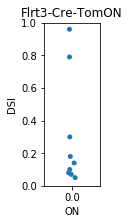

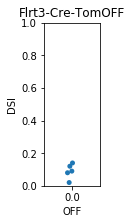

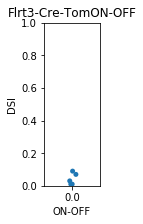

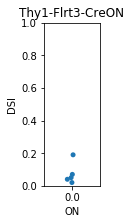

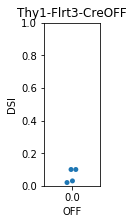

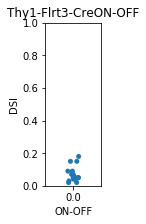

In [216]:
DirectionSelectivity('Moving Dot','Flrt3-Cre-Tom','ON', False)
DirectionSelectivity('Moving Dot','Flrt3-Cre-Tom','OFF', False)
DirectionSelectivity('Moving Dot','Flrt3-Cre-Tom','ON-OFF', False)

DirectionSelectivity('Moving Dot','Thy1-Flrt3-Cre','ON', False)
DirectionSelectivity('Moving Dot','Thy1-Flrt3-Cre','OFF', False)
DirectionSelectivity('Moving Dot','Thy1-Flrt3-Cre','ON-OFF', False)

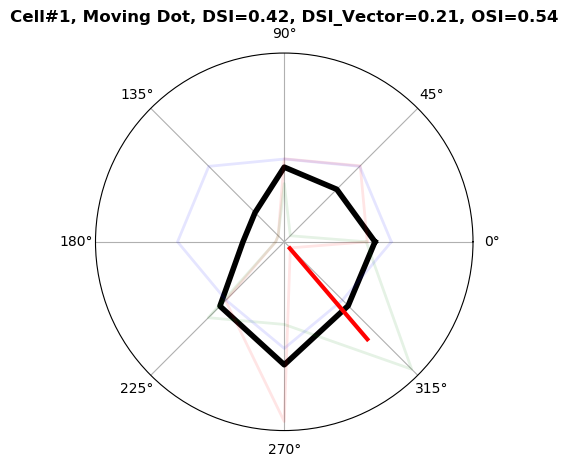

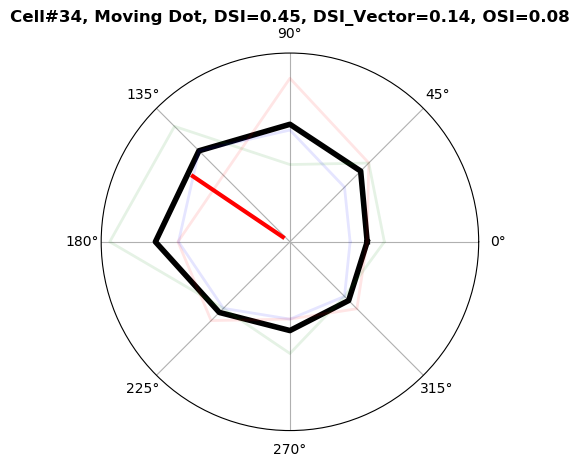

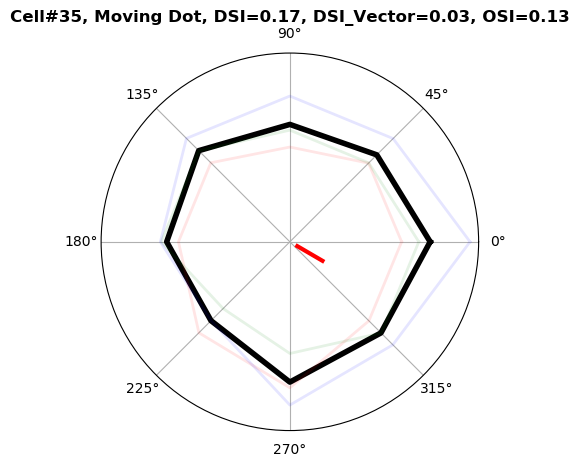

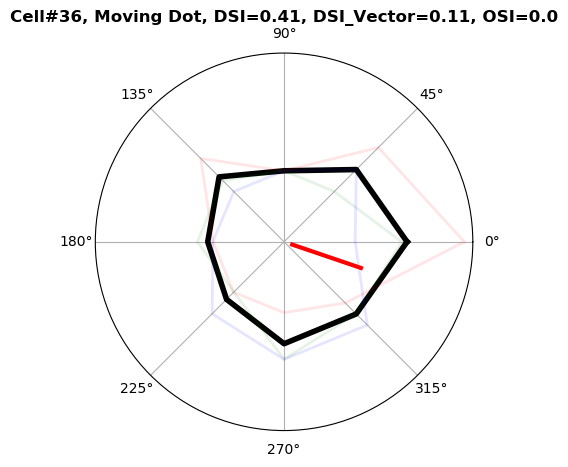

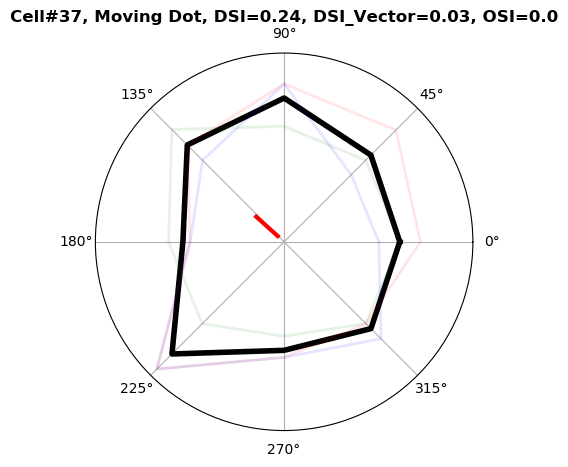

...

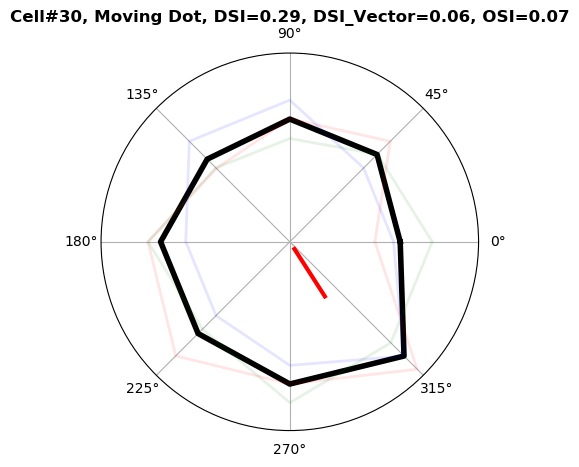

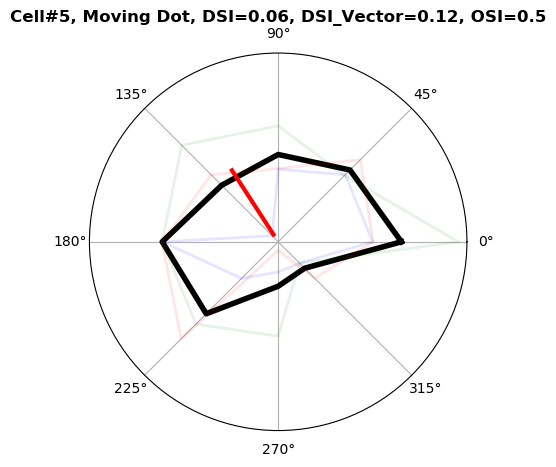

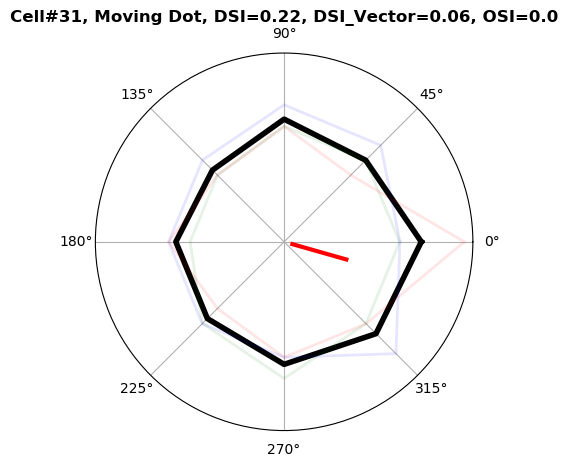

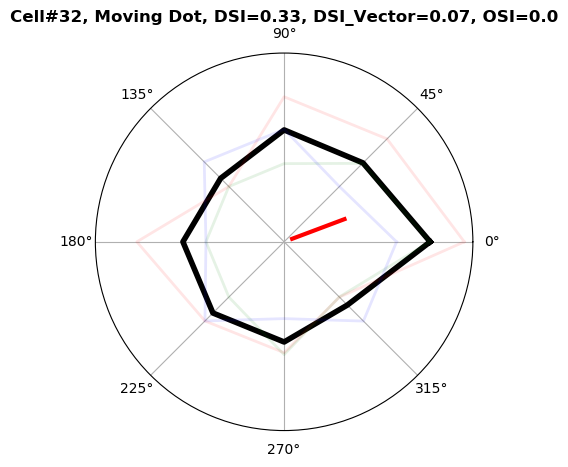

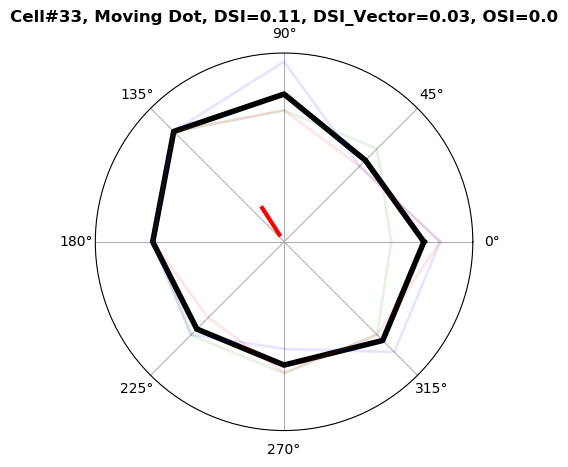

In [8]:
DirectionSelectivity('Moving Dot','Flrt3-Cre-Tom','ON', True) #modify plot to plot smoothed and not smoothed next to each other

In [411]:
#Determines size selectivity of RGC
def Increasing_Dot (movietype, genotype, identity, bin_size, Plot):
    #Determine Maximum Firing rate of Stimulus for ON and OFF phase
    #Plot data as heatmap for ON and OFF phase
    #Input data has to be in subfolder named Input of where script is
    import os
    import pandas as pd
    import numpy as np
    import matplotlib.pyplot as plt
    import glob
    metadata = pd.read_excel(os.getcwd() + '/Input/Metadata.xlsx') #Open Metadatafile
    
    out_all = pd.DataFrame()
    
    #Filter only selected movies
    metadata = pd.read_excel(os.getcwd() + '/Input/Metadata.xlsx') #Open Metadatafile
    metadata = metadata[metadata.Movietype == movietype].reset_index(drop=True)#Filter only for Movie type to Cluster
    metadata = metadata[metadata.Genotype == genotype].reset_index(drop=True)#Filter only for Movie type to Cluster
    metadata = metadata[metadata.Identity == identity].reset_index(drop=True)#Filter only for Movie type to Cluster
    print(len(metadata))
    
    for s in range(len(metadata)):
        filepath = glob.glob(os.getcwd() + '/temp/' + '*' + str(metadata.Filename[s]) + '*' + metadata.Movietype[s] + '*')
        for file in filepath:
            data = pd.read_excel(file)
            # Get stimulus start and stop times,
            start = pd.DataFrame(data['Time_ms'][data['Start_Stop']==1])
            start['index']=start.index
            #start['Type']=Movies[black_white][2]['Type']
            start.reset_index(inplace=True, drop=True)

            stop = pd.DataFrame(data['Time_ms'][data['Start_Stop']==-1])
            stop['index'] = stop.index
            stop.reset_index(inplace=True, drop=True)

            On = pd.DataFrame()
            Off = pd.DataFrame()

            for i in range(len(start)):
                #Calculate difference between start and stop:
                diff = start['index'][1] - stop['index'][0] #calculate difference between start and stop

                On_temp = pd.DataFrame(data.iloc[start['index'][i]:stop['index'][i]].max()).transpose()
                On = On.append(On_temp, ignore_index=True)

                Off_temp = pd.DataFrame(data.iloc[stop['index'][i]:stop['index'][i]+diff].max()).transpose()
                Off = Off.append(Off_temp, ignore_index=True)

            #Normalize to maximum column 'Smooth'
            On['Smooth_Normalized'] = On['Smooth']/((On['Smooth']+0.0000001).max())
            On['Dotsize'] = Movies['Increasing Dot'][1]['Sequence']
            On['Response'] = 'on' #euqals ON response
            
            Off['Smooth_Normalized'] = Off['Smooth']/((Off['Smooth']+0.0000001).max())
            Off['Dotsize'] = Movies['Increasing Dot'][1]['Sequence']
            Off['Response'] = 'off' #equals OFF response
            
        #Combine all ON and OFF cells into one dataframe
        out_all = out_all.append(On, ignore_index=True)
        out_all = out_all.append(Off, ignore_index=True)
        
        Filter = ['Cell#','Dotsize','Response','Smooth_Normalized']
        out_all = out_all[Filter]
        out_all.Dotsize = out_all.Dotsize.astype(float)
        out_all.Smooth_Normalized = out_all.Smooth_Normalized.astype(float)
        out_all['Cell#'] = out_all['Cell#'].astype(str)


    
    #Plot all data
    plt.figure(figsize=(2,1.5))
    ax=sns.lineplot(data = out_all, y='Smooth_Normalized', x='Dotsize', hue='Response', legend=False, err_style='band',estimator='mean')
    ax.set(ylim=(0, 1), xlabel='Dot size (µm)', ylabel='Normalized firing rate (Hz)')
    plt.title(str(genotype)+str(identity))
    plt.savefig(os.getcwd() + '/Output/' + str(genotype) + str(identity) + ' Increasing Dot'+ '.png',dpi=300,bbox_inches='tight')
    
    

10
5
5
5
4
19


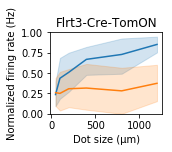

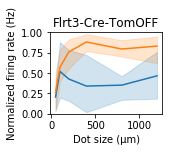

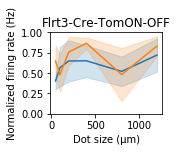

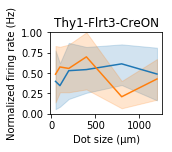

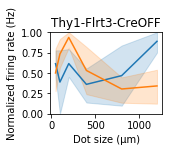

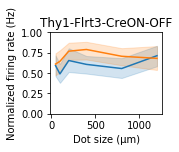

In [413]:
Increasing_Dot('Increasing Dot','Flrt3-Cre-Tom','ON',30,True)
Increasing_Dot('Increasing Dot','Flrt3-Cre-Tom','OFF',30,True)
Increasing_Dot('Increasing Dot','Flrt3-Cre-Tom','ON-OFF',30,True)

Increasing_Dot('Increasing Dot','Thy1-Flrt3-Cre','ON',30,True)
Increasing_Dot('Increasing Dot','Thy1-Flrt3-Cre','OFF',30,True)
Increasing_Dot('Increasing Dot','Thy1-Flrt3-Cre','ON-OFF',30,True)

In [300]:
fmri=sns.load_dataset('fmri')
fmri.head(3)

,subject,timepoint,event,region,signal
0,s13,18,stim,parietal,-0.017552
1,s5,14,stim,parietal,-0.080883
2,s12,18,stim,parietal,-0.081033


In [307]:
type(test.Dotsize[0])

numpy.int64

In [172]:
def Looming (movietype, bin_size, Plot, genotype, identity):
    #black_white: define if it should plot black or white looming stimulus
    #Define Genotype to take for analysis
    #bin_size: define binsize in ms
    import glob

    #Filter only selected movies
    metadata = pd.read_excel(os.getcwd() + '/Input/Metadata.xlsx') #Open Metadatafile
    metadata = metadata[metadata.Movietype == movietype].reset_index(drop=True)#Filter only for Movie type to Cluster
    metadata = metadata[metadata.Genotype == genotype].reset_index(drop=True)#Filter only for Movie type to Cluster
    metadata = metadata[metadata.Identity == identity].reset_index(drop=True)#Filter only for Movie type to Cluster
    out_all = pd.DataFrame()
    print(metadata)
    for s in range(len(metadata)):
        filepath = glob.glob(os.getcwd() + '/temp/' + '*' + str(metadata.Filename[s]) + '*' + metadata.Movietype[s] + '*')
        for file in filepath:
            data = pd.read_excel(file)
            # Get stimulus start and stop times,  start time needs to be shifted by 2 seconds since stationary dot
            # is shown first before it expands
            start = pd.DataFrame(data['Time_ms'][data['Start_Stop']==1])
            start = start.iloc[0:-5]
            start['index']=start.index
            start['Type']=Movies[movietype][2]['Type']
            start.loc[start.Type == 'Looming', 'index'] += round(700/bin_size)# add 2s to index for Looming stimulus
            start.reset_index(inplace=True, drop=True)

            stop = pd.DataFrame(data['Time_ms'][data['Start_Stop']==-1])
            stop['index'] = stop.index
            stop.reset_index(inplace=True, drop=True)


            out = pd.DataFrame()
            for i in range(len(start)):
                maximum = pd.DataFrame(data.iloc[start['index'][i]:stop['index'][i]].max()).transpose()
                out= out.append(maximum, ignore_index=True)   

            #Determine average of Smooth Trial columns and determine STD
            #Maximum of all trials
            out['Smooth_Max_AVG'] = out.loc[:,['Trial0','Trial1','Trial2']].mean(axis=1)
            #Standard deviation of max from all trials
            out['Smooth_Max_AVG_STD'] = out.loc[:,['Trial0','Trial1','Trial2']].std(axis=1)
            #Introducing Sitmulus type column
            out['StimType'] = Movies[movietype][1]['Sequence']
            out['Type'] =  Movies[movietype][2]['Type']
            out['Speed'] = Movies[movietype][3]['Speed']
            out['Identity'] = metadata.Identity[s] # Add if cell is ON, OFF or ON/OFF
            #Merging moving dot directions 
            out=out.groupby(['StimType'],sort=True).max()
            #NORMALIZATION
            #Split dataframe into Looming and moving dot to normalize each to maximum:
            out_loom = out[out.Type=='Looming']
            out_loom['Smooth_Max_AVG_Normalized'] = out_loom.Smooth_Max_AVG/(out_loom['Smooth_Max_AVG'].max())

            out_dot = out[out.Type=='Dot']
            out_dot['Smooth_Max_AVG_Normalized'] = out_dot.Smooth_Max_AVG/(out_dot['Smooth_Max_AVG'].max())

            out_loom = out_loom.append(out_dot, ignore_index=True)
            out = out_loom

            #Plot Linegraph with Motion speed against Peakfiring rate
            if Plot == True:
                plt.figure(figsize=(3,3))
                plt.title('Cell#' + str(data['Cell#'][0]) + ' ' + str(movietype))
                ax=sns.lineplot(data = out, y='Smooth_Max_AVG', x = 'Speed', hue='Type') 
                ax.set(ylim=(0, None), xlabel='Motion speed (µm/s)', ylabel='Peak firing rate (Hz)')

                sns.despine(top=True, right=True, offset=10)
                plt.savefig(os.getcwd() + '/Output/' + 'Cell#_' + str((data['Cell#'][0])) + str(data.Movietype[0]) + 'Linegraph' '.png',dpi=300,bbox_inches='tight')

            out_all = out_all.append(out, ignore_index=True) #contains all data to be plot with seaborn
            
    #Plot figure of all cells
    plt.figure(figsize=(2,2))
    ax=sns.lineplot(data = out_all, y='Smooth_Max_AVG_Normalized', x='Speed',style='Type', size=None ,
                    markers = True, err_style='bars', dashes=True, ci=0.9, legend='brief')
    ax.set(ylim=(0, None), xlabel='Motion speed (µm/s)', ylabel='Peak firing rate (Hz)')
    plt.title(str(genotype)+str(identity))
    plt.savefig(os.getcwd() + '/Output/' + str(genotype) + str(identity) + ' Looming'+ '.png',dpi=300,bbox_inches='tight')
    

                 Filename  Cellname      Movietype  Starttime  Stoptime  \
0  19305005_Looming_White        20  Looming White          0    732000   
1  19305012_Looming_White        21  Looming White          0    732000   

        Genotype  Age  Repeats  Somasize Identity  
0  Flrt3-Cre-Tom  NaN        3       NaN       ON  
1  Flrt3-Cre-Tom  NaN        3       NaN       ON  
                 Filename  Cellname      Movietype  Starttime  Stoptime  \
0  19211003_Looming_Black         8  Looming Black          0    684000   
1  19212004_Looming_Black         9  Looming Black          0    732000   
2  19221017_Looming_Black        12  Looming Black          0    732000   
3  19226005_Looming_Black        23  Looming Black          0    732000   

        Genotype  Age  Repeats  Somasize Identity  
0  Flrt3-Cre-Tom  NaN        3       NaN      OFF  
1  Flrt3-Cre-Tom  NaN        3       NaN      OFF  
2  Flrt3-Cre-Tom  NaN        3       NaN      OFF  
3  Flrt3-Cre-Tom  NaN        3    

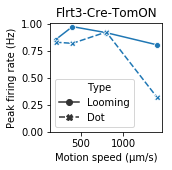

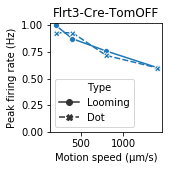

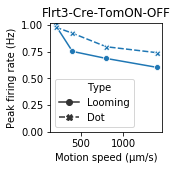

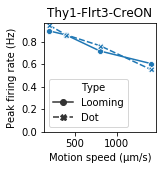

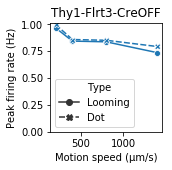

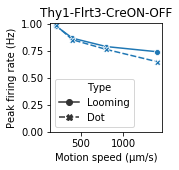

In [173]:
Looming('Looming White', 30, False, 'Flrt3-Cre-Tom','ON')
Looming('Looming Black', 30, False, 'Flrt3-Cre-Tom','OFF')
Looming('Looming Black', 30, False, 'Flrt3-Cre-Tom','ON-OFF')

Looming('Looming White', 30, False, 'Thy1-Flrt3-Cre','ON')
Looming('Looming Black', 30, False, 'Thy1-Flrt3-Cre','OFF')
Looming('Looming Black', 30, False, 'Thy1-Flrt3-Cre','ON-OFF')